In [1]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd 
import random 
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim

data_dir = 'dataset'

train_dataset = torchvision.datasets.MNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.MNIST(data_dir, train=False, download=True)

train_transform = transforms.Compose([
transforms.ToTensor(),
])

test_transform = transforms.Compose([
transforms.ToTensor(),
])

train_dataset.transform = train_transform
test_dataset.transform = test_transform

m=len(train_dataset)

train_data, val_data = random_split(train_dataset, [int(m-m*0.2), int(m*0.2)])
batch_size=256

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,shuffle=True)

In [2]:
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 8, 3, stride=2, padding=1),
            nn.ReLU(True),
            nn.Conv2d(8, 16, 3, stride=2, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, 3, stride=2, padding=0),
            nn.ReLU(True)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)
### Linear section
        self.encoder_lin = nn.Sequential(
            nn.Linear(3 * 3 * 32, 128),
            nn.ReLU(True),
            nn.Linear(128, encoded_space_dim)
        )
        
    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(encoded_space_dim, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1, 
        unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, 
            stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2, 
            padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2, 
            padding=1, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [3]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
d = 4

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
encoder = Encoder(encoded_space_dim=d,fc2_input_dim=128)
decoder = Decoder(encoded_space_dim=d,fc2_input_dim=128)
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

Selected device: cuda


Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=4, out_features=128, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=128, out_features=288, bias=True)
    (3): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

In [4]:
### Training function
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [5]:
### Testing function
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [6]:

def plot_ae_outputs(encoder,decoder,n=10):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()   

	 partial train loss (single batch): 0.252953
	 partial train loss (single batch): 0.245774
	 partial train loss (single batch): 0.240452
	 partial train loss (single batch): 0.235688
	 partial train loss (single batch): 0.232003
	 partial train loss (single batch): 0.228113
	 partial train loss (single batch): 0.225388
	 partial train loss (single batch): 0.222487
	 partial train loss (single batch): 0.220104
	 partial train loss (single batch): 0.218176
	 partial train loss (single batch): 0.216006
	 partial train loss (single batch): 0.213986
	 partial train loss (single batch): 0.211231
	 partial train loss (single batch): 0.209465
	 partial train loss (single batch): 0.207783
	 partial train loss (single batch): 0.205607
	 partial train loss (single batch): 0.203246
	 partial train loss (single batch): 0.201276
	 partial train loss (single batch): 0.199063
	 partial train loss (single batch): 0.197392
	 partial train loss (single batch): 0.195369
	 partial train loss (single batch

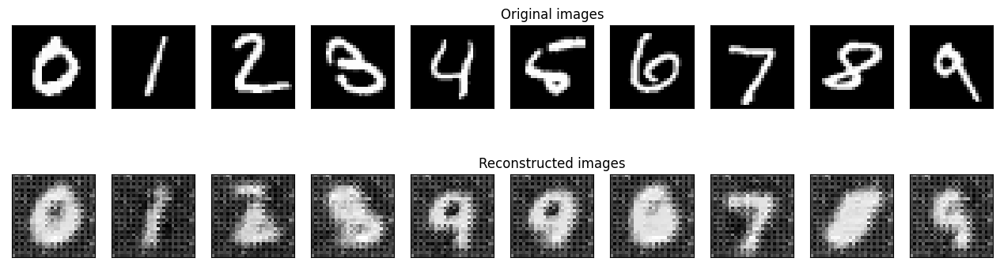

	 partial train loss (single batch): 0.066972
	 partial train loss (single batch): 0.066437
	 partial train loss (single batch): 0.066636
	 partial train loss (single batch): 0.065948
	 partial train loss (single batch): 0.064788
	 partial train loss (single batch): 0.064768
	 partial train loss (single batch): 0.064331
	 partial train loss (single batch): 0.064818
	 partial train loss (single batch): 0.063577
	 partial train loss (single batch): 0.063540
	 partial train loss (single batch): 0.063364
	 partial train loss (single batch): 0.064324
	 partial train loss (single batch): 0.063853
	 partial train loss (single batch): 0.063162
	 partial train loss (single batch): 0.062679
	 partial train loss (single batch): 0.062281
	 partial train loss (single batch): 0.063128
	 partial train loss (single batch): 0.062520
	 partial train loss (single batch): 0.062694
	 partial train loss (single batch): 0.062131
	 partial train loss (single batch): 0.062198
	 partial train loss (single batch

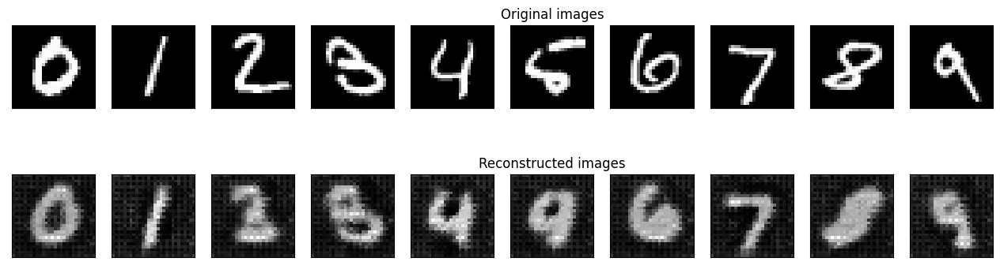

	 partial train loss (single batch): 0.048201
	 partial train loss (single batch): 0.048096
	 partial train loss (single batch): 0.048378
	 partial train loss (single batch): 0.048098
	 partial train loss (single batch): 0.046659
	 partial train loss (single batch): 0.047476
	 partial train loss (single batch): 0.046528
	 partial train loss (single batch): 0.046758
	 partial train loss (single batch): 0.046451
	 partial train loss (single batch): 0.046185
	 partial train loss (single batch): 0.046469
	 partial train loss (single batch): 0.047136
	 partial train loss (single batch): 0.046982
	 partial train loss (single batch): 0.047104
	 partial train loss (single batch): 0.046187
	 partial train loss (single batch): 0.045846
	 partial train loss (single batch): 0.047419
	 partial train loss (single batch): 0.045851
	 partial train loss (single batch): 0.047109
	 partial train loss (single batch): 0.046805
	 partial train loss (single batch): 0.046255
	 partial train loss (single batch

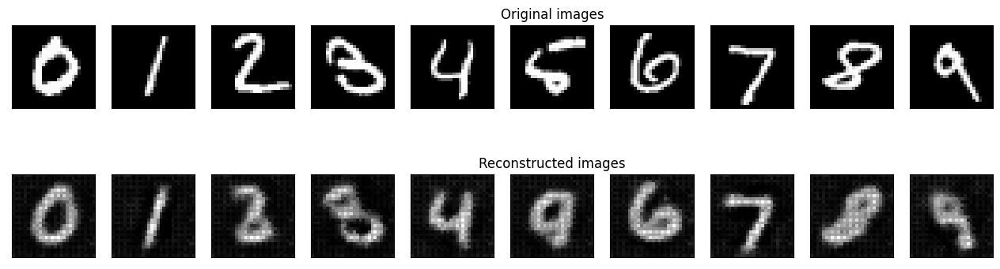

	 partial train loss (single batch): 0.038921
	 partial train loss (single batch): 0.039115
	 partial train loss (single batch): 0.039278
	 partial train loss (single batch): 0.039761
	 partial train loss (single batch): 0.037597
	 partial train loss (single batch): 0.038594
	 partial train loss (single batch): 0.037832
	 partial train loss (single batch): 0.037290
	 partial train loss (single batch): 0.037770
	 partial train loss (single batch): 0.037421
	 partial train loss (single batch): 0.038304
	 partial train loss (single batch): 0.037910
	 partial train loss (single batch): 0.037629
	 partial train loss (single batch): 0.038820
	 partial train loss (single batch): 0.037433
	 partial train loss (single batch): 0.036988
	 partial train loss (single batch): 0.038550
	 partial train loss (single batch): 0.037387
	 partial train loss (single batch): 0.038699
	 partial train loss (single batch): 0.037766
	 partial train loss (single batch): 0.037281
	 partial train loss (single batch

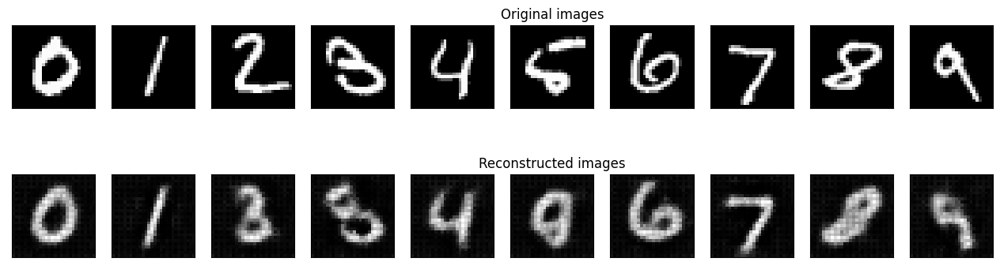

	 partial train loss (single batch): 0.033611
	 partial train loss (single batch): 0.034007
	 partial train loss (single batch): 0.034164
	 partial train loss (single batch): 0.034791
	 partial train loss (single batch): 0.033045
	 partial train loss (single batch): 0.033232
	 partial train loss (single batch): 0.032938
	 partial train loss (single batch): 0.032436
	 partial train loss (single batch): 0.033098
	 partial train loss (single batch): 0.032751
	 partial train loss (single batch): 0.033624
	 partial train loss (single batch): 0.032683
	 partial train loss (single batch): 0.033131
	 partial train loss (single batch): 0.034386
	 partial train loss (single batch): 0.032722
	 partial train loss (single batch): 0.032313
	 partial train loss (single batch): 0.034060
	 partial train loss (single batch): 0.032817
	 partial train loss (single batch): 0.034533
	 partial train loss (single batch): 0.033201
	 partial train loss (single batch): 0.032462
	 partial train loss (single batch

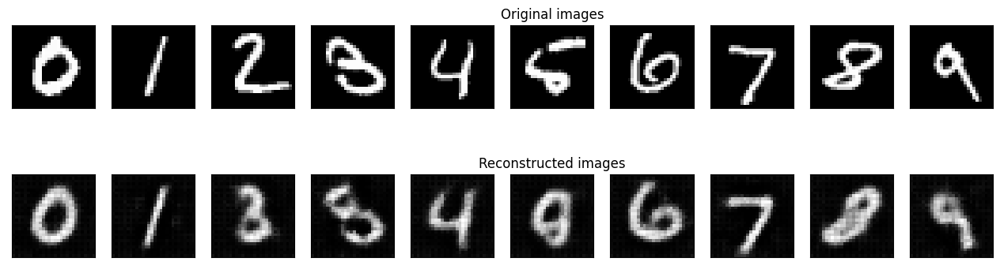

	 partial train loss (single batch): 0.031379
	 partial train loss (single batch): 0.031754
	 partial train loss (single batch): 0.032087
	 partial train loss (single batch): 0.032588
	 partial train loss (single batch): 0.030968
	 partial train loss (single batch): 0.031206
	 partial train loss (single batch): 0.030979
	 partial train loss (single batch): 0.030441
	 partial train loss (single batch): 0.031283
	 partial train loss (single batch): 0.030900
	 partial train loss (single batch): 0.031586
	 partial train loss (single batch): 0.030839
	 partial train loss (single batch): 0.031433
	 partial train loss (single batch): 0.032482
	 partial train loss (single batch): 0.030936
	 partial train loss (single batch): 0.030346
	 partial train loss (single batch): 0.032107
	 partial train loss (single batch): 0.030909
	 partial train loss (single batch): 0.032607
	 partial train loss (single batch): 0.031257
	 partial train loss (single batch): 0.030501
	 partial train loss (single batch

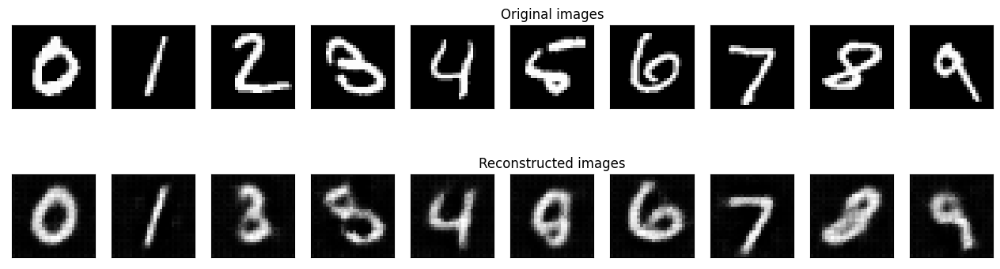

	 partial train loss (single batch): 0.030243
	 partial train loss (single batch): 0.030678
	 partial train loss (single batch): 0.030817
	 partial train loss (single batch): 0.031618
	 partial train loss (single batch): 0.030051
	 partial train loss (single batch): 0.030034
	 partial train loss (single batch): 0.030009
	 partial train loss (single batch): 0.029492
	 partial train loss (single batch): 0.030165
	 partial train loss (single batch): 0.029892
	 partial train loss (single batch): 0.030594
	 partial train loss (single batch): 0.029612
	 partial train loss (single batch): 0.030492
	 partial train loss (single batch): 0.031320
	 partial train loss (single batch): 0.029727
	 partial train loss (single batch): 0.029460
	 partial train loss (single batch): 0.031081
	 partial train loss (single batch): 0.029765
	 partial train loss (single batch): 0.031600
	 partial train loss (single batch): 0.030013
	 partial train loss (single batch): 0.029321
	 partial train loss (single batch

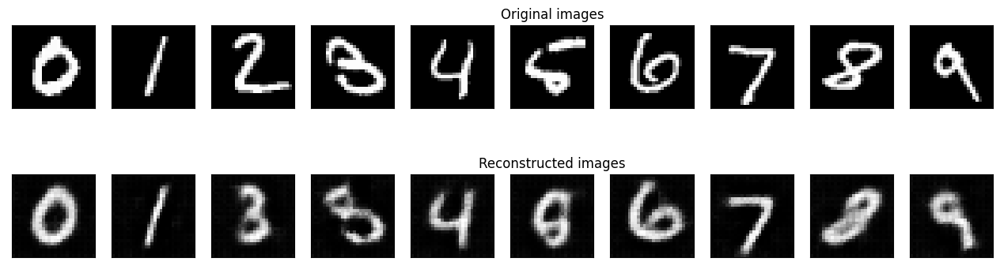

	 partial train loss (single batch): 0.029548
	 partial train loss (single batch): 0.030116
	 partial train loss (single batch): 0.030128
	 partial train loss (single batch): 0.030833
	 partial train loss (single batch): 0.029335
	 partial train loss (single batch): 0.029316
	 partial train loss (single batch): 0.029154
	 partial train loss (single batch): 0.028911
	 partial train loss (single batch): 0.029377
	 partial train loss (single batch): 0.029098
	 partial train loss (single batch): 0.029977
	 partial train loss (single batch): 0.028937
	 partial train loss (single batch): 0.029714
	 partial train loss (single batch): 0.030697
	 partial train loss (single batch): 0.028972
	 partial train loss (single batch): 0.028723
	 partial train loss (single batch): 0.030487
	 partial train loss (single batch): 0.028895
	 partial train loss (single batch): 0.030796
	 partial train loss (single batch): 0.029299
	 partial train loss (single batch): 0.028603
	 partial train loss (single batch

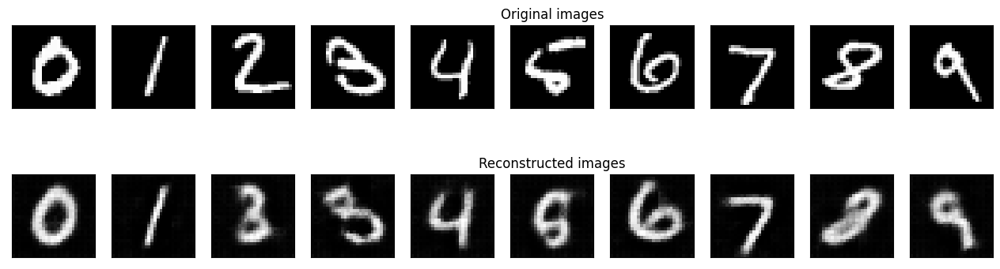

	 partial train loss (single batch): 0.028973
	 partial train loss (single batch): 0.029574
	 partial train loss (single batch): 0.029638
	 partial train loss (single batch): 0.030312
	 partial train loss (single batch): 0.028787
	 partial train loss (single batch): 0.028796
	 partial train loss (single batch): 0.028621
	 partial train loss (single batch): 0.028366
	 partial train loss (single batch): 0.028728
	 partial train loss (single batch): 0.028471
	 partial train loss (single batch): 0.029372
	 partial train loss (single batch): 0.028355
	 partial train loss (single batch): 0.029140
	 partial train loss (single batch): 0.030197
	 partial train loss (single batch): 0.028397
	 partial train loss (single batch): 0.028166
	 partial train loss (single batch): 0.029977
	 partial train loss (single batch): 0.028290
	 partial train loss (single batch): 0.030156
	 partial train loss (single batch): 0.028762
	 partial train loss (single batch): 0.028125
	 partial train loss (single batch

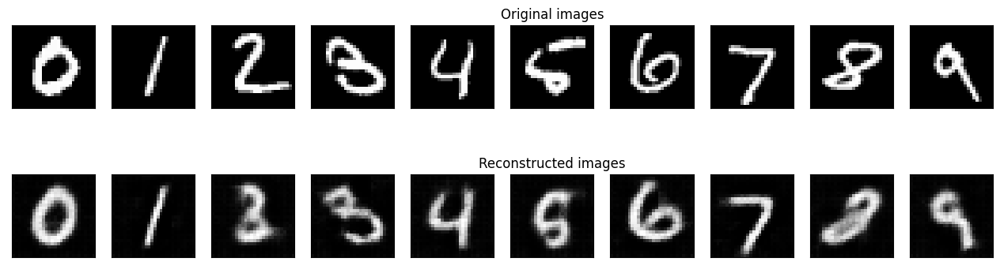

	 partial train loss (single batch): 0.028595
	 partial train loss (single batch): 0.029242
	 partial train loss (single batch): 0.029274
	 partial train loss (single batch): 0.029821
	 partial train loss (single batch): 0.028337
	 partial train loss (single batch): 0.028406
	 partial train loss (single batch): 0.028230
	 partial train loss (single batch): 0.028016
	 partial train loss (single batch): 0.028289
	 partial train loss (single batch): 0.028041
	 partial train loss (single batch): 0.028969
	 partial train loss (single batch): 0.027942
	 partial train loss (single batch): 0.028755
	 partial train loss (single batch): 0.029753
	 partial train loss (single batch): 0.027998
	 partial train loss (single batch): 0.027830
	 partial train loss (single batch): 0.029629
	 partial train loss (single batch): 0.027777
	 partial train loss (single batch): 0.029668
	 partial train loss (single batch): 0.028332
	 partial train loss (single batch): 0.027732
	 partial train loss (single batch

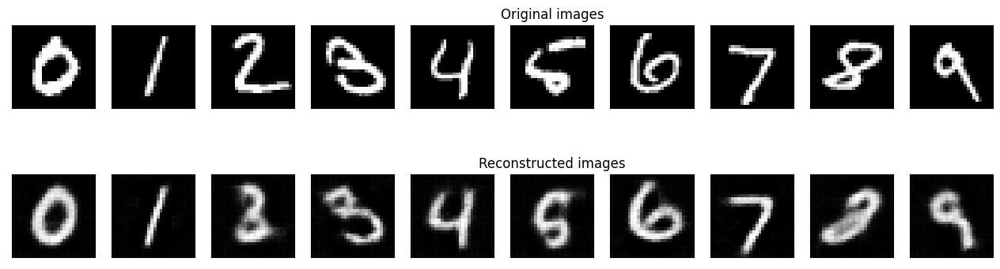

	 partial train loss (single batch): 0.028242
	 partial train loss (single batch): 0.028834
	 partial train loss (single batch): 0.028901
	 partial train loss (single batch): 0.029471
	 partial train loss (single batch): 0.028052
	 partial train loss (single batch): 0.028144
	 partial train loss (single batch): 0.027860
	 partial train loss (single batch): 0.027738
	 partial train loss (single batch): 0.027937
	 partial train loss (single batch): 0.027592
	 partial train loss (single batch): 0.028573
	 partial train loss (single batch): 0.027657
	 partial train loss (single batch): 0.028397
	 partial train loss (single batch): 0.029389
	 partial train loss (single batch): 0.027643
	 partial train loss (single batch): 0.027493
	 partial train loss (single batch): 0.029335
	 partial train loss (single batch): 0.027347
	 partial train loss (single batch): 0.029303
	 partial train loss (single batch): 0.027990
	 partial train loss (single batch): 0.027428
	 partial train loss (single batch

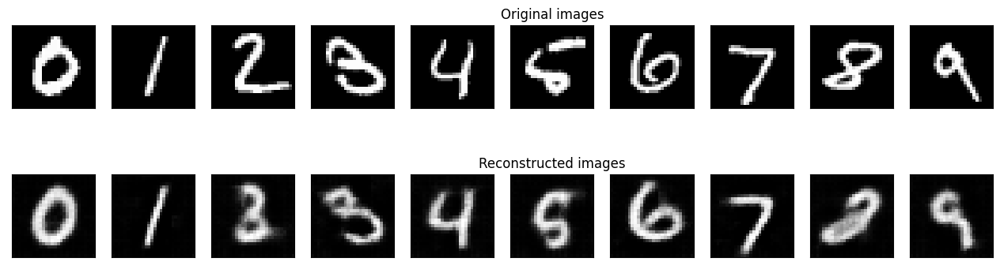

	 partial train loss (single batch): 0.027902
	 partial train loss (single batch): 0.028542
	 partial train loss (single batch): 0.028682
	 partial train loss (single batch): 0.029217
	 partial train loss (single batch): 0.027681
	 partial train loss (single batch): 0.027904
	 partial train loss (single batch): 0.027551
	 partial train loss (single batch): 0.027369
	 partial train loss (single batch): 0.027624
	 partial train loss (single batch): 0.027301
	 partial train loss (single batch): 0.028218
	 partial train loss (single batch): 0.027334
	 partial train loss (single batch): 0.028067
	 partial train loss (single batch): 0.029023
	 partial train loss (single batch): 0.027345
	 partial train loss (single batch): 0.027215
	 partial train loss (single batch): 0.029038
	 partial train loss (single batch): 0.026984
	 partial train loss (single batch): 0.029005
	 partial train loss (single batch): 0.027738
	 partial train loss (single batch): 0.027161
	 partial train loss (single batch

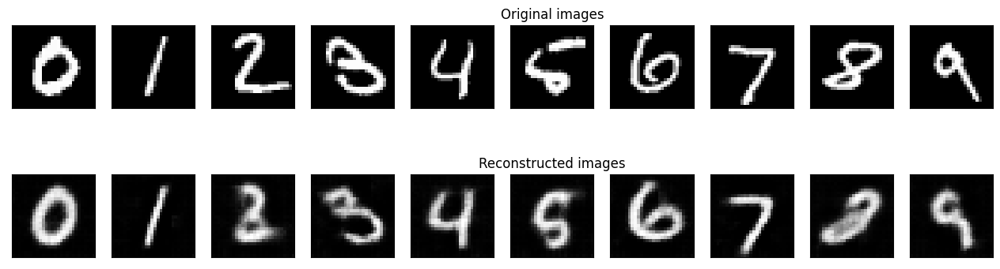

	 partial train loss (single batch): 0.027647
	 partial train loss (single batch): 0.028211
	 partial train loss (single batch): 0.028343
	 partial train loss (single batch): 0.028905
	 partial train loss (single batch): 0.027413
	 partial train loss (single batch): 0.027632
	 partial train loss (single batch): 0.027293
	 partial train loss (single batch): 0.027162
	 partial train loss (single batch): 0.027407
	 partial train loss (single batch): 0.027029
	 partial train loss (single batch): 0.027925
	 partial train loss (single batch): 0.027124
	 partial train loss (single batch): 0.027828
	 partial train loss (single batch): 0.028717
	 partial train loss (single batch): 0.027142
	 partial train loss (single batch): 0.026891
	 partial train loss (single batch): 0.028787
	 partial train loss (single batch): 0.026798
	 partial train loss (single batch): 0.028700
	 partial train loss (single batch): 0.027566
	 partial train loss (single batch): 0.026945
	 partial train loss (single batch

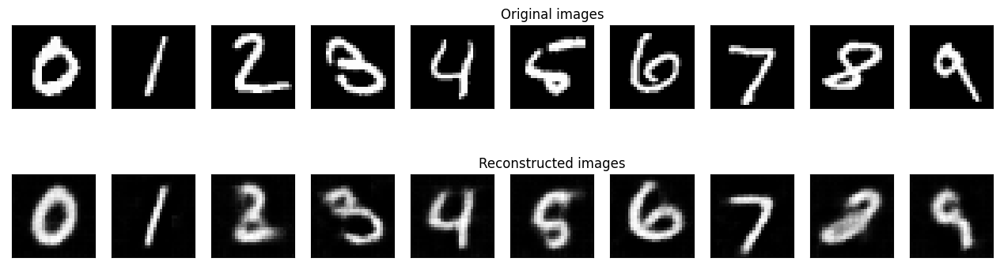

	 partial train loss (single batch): 0.027472
	 partial train loss (single batch): 0.027948
	 partial train loss (single batch): 0.028066
	 partial train loss (single batch): 0.028659
	 partial train loss (single batch): 0.027136
	 partial train loss (single batch): 0.027516
	 partial train loss (single batch): 0.027115
	 partial train loss (single batch): 0.026905
	 partial train loss (single batch): 0.027210
	 partial train loss (single batch): 0.026794
	 partial train loss (single batch): 0.027714
	 partial train loss (single batch): 0.026925
	 partial train loss (single batch): 0.027649
	 partial train loss (single batch): 0.028432
	 partial train loss (single batch): 0.026995
	 partial train loss (single batch): 0.026649
	 partial train loss (single batch): 0.028461
	 partial train loss (single batch): 0.026620
	 partial train loss (single batch): 0.028451
	 partial train loss (single batch): 0.027333
	 partial train loss (single batch): 0.026761
	 partial train loss (single batch

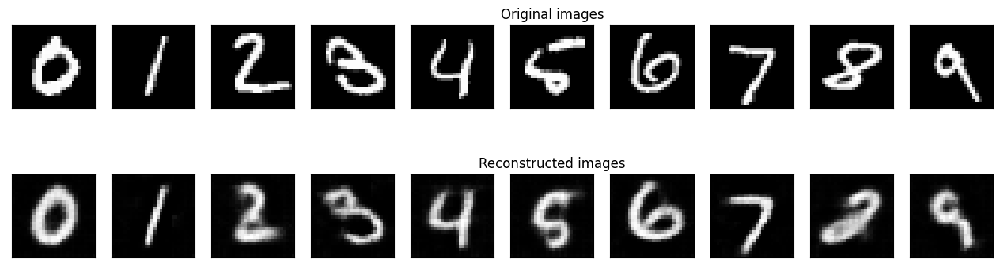

	 partial train loss (single batch): 0.027367
	 partial train loss (single batch): 0.027844
	 partial train loss (single batch): 0.027878
	 partial train loss (single batch): 0.028506
	 partial train loss (single batch): 0.026968
	 partial train loss (single batch): 0.027355
	 partial train loss (single batch): 0.026990
	 partial train loss (single batch): 0.026766
	 partial train loss (single batch): 0.027085
	 partial train loss (single batch): 0.026657
	 partial train loss (single batch): 0.027563
	 partial train loss (single batch): 0.026788
	 partial train loss (single batch): 0.027495
	 partial train loss (single batch): 0.028227
	 partial train loss (single batch): 0.026785
	 partial train loss (single batch): 0.026487
	 partial train loss (single batch): 0.028304
	 partial train loss (single batch): 0.026415
	 partial train loss (single batch): 0.028236
	 partial train loss (single batch): 0.027202
	 partial train loss (single batch): 0.026524
	 partial train loss (single batch

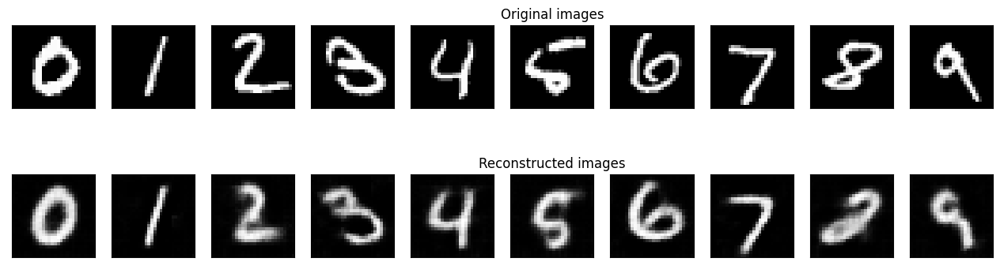

	 partial train loss (single batch): 0.027183
	 partial train loss (single batch): 0.027615
	 partial train loss (single batch): 0.027669
	 partial train loss (single batch): 0.028350
	 partial train loss (single batch): 0.026743
	 partial train loss (single batch): 0.027198
	 partial train loss (single batch): 0.026858
	 partial train loss (single batch): 0.026600
	 partial train loss (single batch): 0.026919
	 partial train loss (single batch): 0.026443
	 partial train loss (single batch): 0.027392
	 partial train loss (single batch): 0.026586
	 partial train loss (single batch): 0.027237
	 partial train loss (single batch): 0.028108
	 partial train loss (single batch): 0.026651
	 partial train loss (single batch): 0.026331
	 partial train loss (single batch): 0.028119
	 partial train loss (single batch): 0.026236
	 partial train loss (single batch): 0.027989
	 partial train loss (single batch): 0.027021
	 partial train loss (single batch): 0.026413
	 partial train loss (single batch

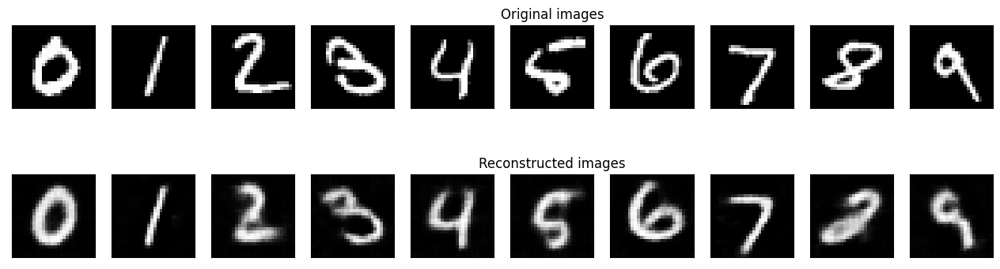

	 partial train loss (single batch): 0.027009
	 partial train loss (single batch): 0.027491
	 partial train loss (single batch): 0.027474
	 partial train loss (single batch): 0.028219
	 partial train loss (single batch): 0.026645
	 partial train loss (single batch): 0.027060
	 partial train loss (single batch): 0.026759
	 partial train loss (single batch): 0.026418
	 partial train loss (single batch): 0.026824
	 partial train loss (single batch): 0.026251
	 partial train loss (single batch): 0.027308
	 partial train loss (single batch): 0.026420
	 partial train loss (single batch): 0.027068
	 partial train loss (single batch): 0.027917
	 partial train loss (single batch): 0.026454
	 partial train loss (single batch): 0.026227
	 partial train loss (single batch): 0.028002
	 partial train loss (single batch): 0.026040
	 partial train loss (single batch): 0.027874
	 partial train loss (single batch): 0.026940
	 partial train loss (single batch): 0.026275
	 partial train loss (single batch

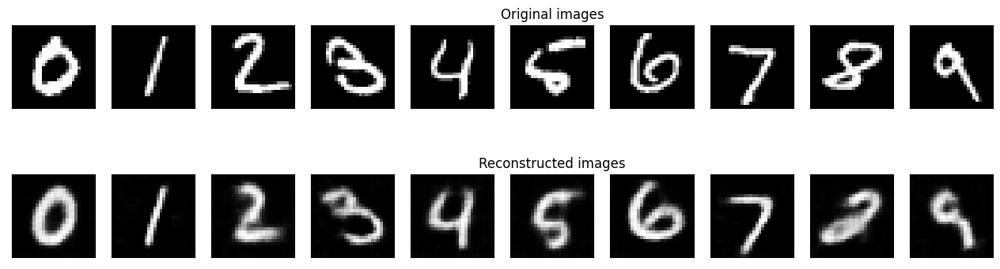

	 partial train loss (single batch): 0.026976
	 partial train loss (single batch): 0.027384
	 partial train loss (single batch): 0.027256
	 partial train loss (single batch): 0.028083
	 partial train loss (single batch): 0.026521
	 partial train loss (single batch): 0.026963
	 partial train loss (single batch): 0.026635
	 partial train loss (single batch): 0.026261
	 partial train loss (single batch): 0.026654
	 partial train loss (single batch): 0.026087
	 partial train loss (single batch): 0.027115
	 partial train loss (single batch): 0.026322
	 partial train loss (single batch): 0.026948
	 partial train loss (single batch): 0.027750
	 partial train loss (single batch): 0.026337
	 partial train loss (single batch): 0.026031
	 partial train loss (single batch): 0.027909
	 partial train loss (single batch): 0.025882
	 partial train loss (single batch): 0.027671
	 partial train loss (single batch): 0.026843
	 partial train loss (single batch): 0.026160
	 partial train loss (single batch

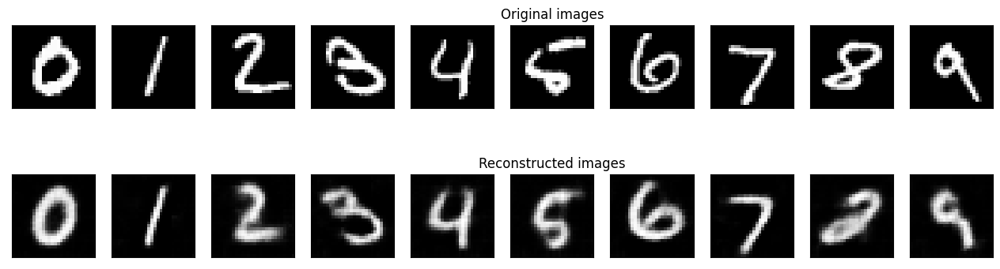

	 partial train loss (single batch): 0.026934
	 partial train loss (single batch): 0.027249
	 partial train loss (single batch): 0.027078
	 partial train loss (single batch): 0.027932
	 partial train loss (single batch): 0.026454
	 partial train loss (single batch): 0.026819
	 partial train loss (single batch): 0.026505
	 partial train loss (single batch): 0.026127
	 partial train loss (single batch): 0.026586
	 partial train loss (single batch): 0.025953
	 partial train loss (single batch): 0.027107
	 partial train loss (single batch): 0.026221
	 partial train loss (single batch): 0.026832
	 partial train loss (single batch): 0.027592
	 partial train loss (single batch): 0.026217
	 partial train loss (single batch): 0.025949
	 partial train loss (single batch): 0.027716
	 partial train loss (single batch): 0.025726
	 partial train loss (single batch): 0.027547
	 partial train loss (single batch): 0.026702
	 partial train loss (single batch): 0.026018
	 partial train loss (single batch

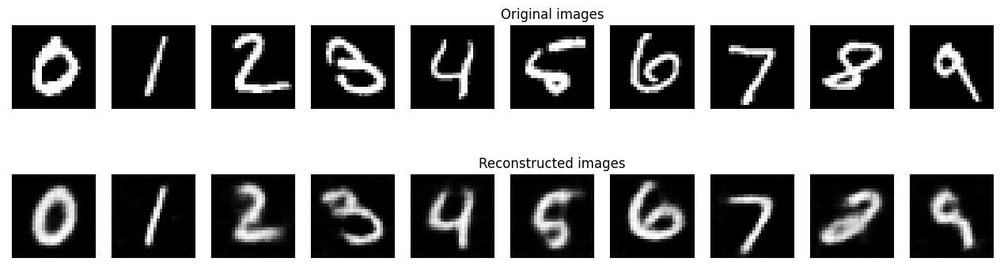

	 partial train loss (single batch): 0.026795
	 partial train loss (single batch): 0.027044
	 partial train loss (single batch): 0.026937
	 partial train loss (single batch): 0.027809
	 partial train loss (single batch): 0.026379
	 partial train loss (single batch): 0.026708
	 partial train loss (single batch): 0.026474
	 partial train loss (single batch): 0.025973
	 partial train loss (single batch): 0.026528
	 partial train loss (single batch): 0.025762
	 partial train loss (single batch): 0.026993
	 partial train loss (single batch): 0.026065
	 partial train loss (single batch): 0.026737
	 partial train loss (single batch): 0.027503
	 partial train loss (single batch): 0.026058
	 partial train loss (single batch): 0.025842
	 partial train loss (single batch): 0.027686
	 partial train loss (single batch): 0.025667
	 partial train loss (single batch): 0.027443
	 partial train loss (single batch): 0.026604
	 partial train loss (single batch): 0.025930
	 partial train loss (single batch

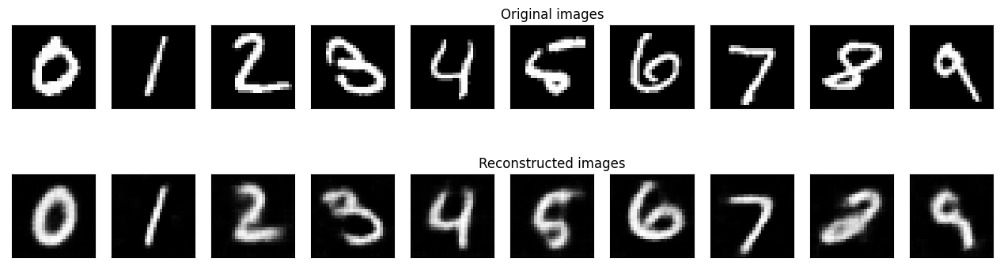

	 partial train loss (single batch): 0.026663
	 partial train loss (single batch): 0.026914
	 partial train loss (single batch): 0.026794
	 partial train loss (single batch): 0.027627
	 partial train loss (single batch): 0.026208
	 partial train loss (single batch): 0.026532
	 partial train loss (single batch): 0.026313
	 partial train loss (single batch): 0.025827
	 partial train loss (single batch): 0.026355
	 partial train loss (single batch): 0.025604
	 partial train loss (single batch): 0.026885
	 partial train loss (single batch): 0.025992
	 partial train loss (single batch): 0.026619
	 partial train loss (single batch): 0.027378
	 partial train loss (single batch): 0.025926
	 partial train loss (single batch): 0.025763
	 partial train loss (single batch): 0.027471
	 partial train loss (single batch): 0.025530
	 partial train loss (single batch): 0.027369
	 partial train loss (single batch): 0.026400
	 partial train loss (single batch): 0.025878
	 partial train loss (single batch

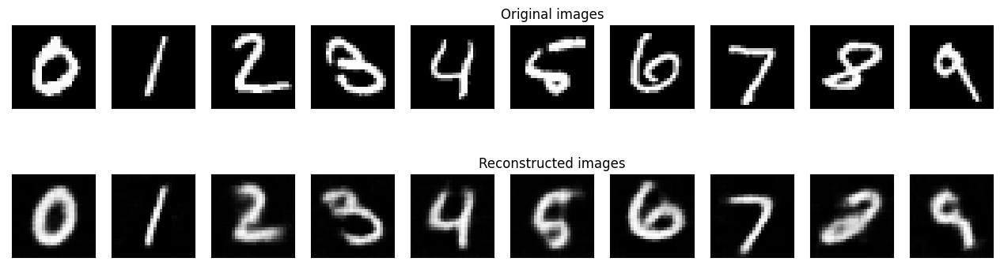

	 partial train loss (single batch): 0.026625
	 partial train loss (single batch): 0.026839
	 partial train loss (single batch): 0.026649
	 partial train loss (single batch): 0.027540
	 partial train loss (single batch): 0.026104
	 partial train loss (single batch): 0.026430
	 partial train loss (single batch): 0.026206
	 partial train loss (single batch): 0.025739
	 partial train loss (single batch): 0.026220
	 partial train loss (single batch): 0.025512
	 partial train loss (single batch): 0.026767
	 partial train loss (single batch): 0.025936
	 partial train loss (single batch): 0.026470
	 partial train loss (single batch): 0.027206
	 partial train loss (single batch): 0.025783
	 partial train loss (single batch): 0.025671
	 partial train loss (single batch): 0.027402
	 partial train loss (single batch): 0.025448
	 partial train loss (single batch): 0.027208
	 partial train loss (single batch): 0.026243
	 partial train loss (single batch): 0.025693
	 partial train loss (single batch

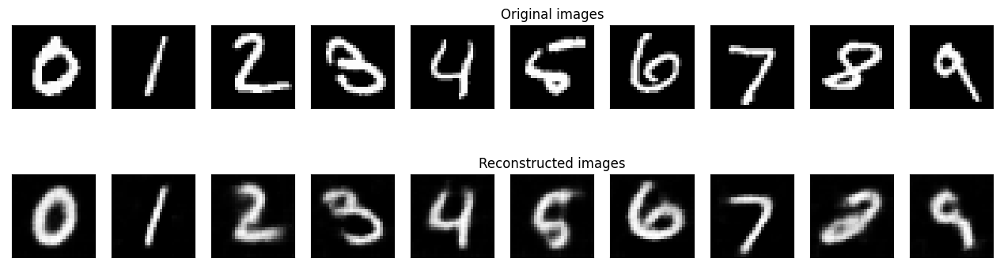

	 partial train loss (single batch): 0.026548
	 partial train loss (single batch): 0.026748
	 partial train loss (single batch): 0.026491
	 partial train loss (single batch): 0.027410
	 partial train loss (single batch): 0.025936
	 partial train loss (single batch): 0.026318
	 partial train loss (single batch): 0.026096
	 partial train loss (single batch): 0.025617
	 partial train loss (single batch): 0.026111
	 partial train loss (single batch): 0.025438
	 partial train loss (single batch): 0.026608
	 partial train loss (single batch): 0.025782
	 partial train loss (single batch): 0.026428
	 partial train loss (single batch): 0.027177
	 partial train loss (single batch): 0.025667
	 partial train loss (single batch): 0.025556
	 partial train loss (single batch): 0.027386
	 partial train loss (single batch): 0.025446
	 partial train loss (single batch): 0.027196
	 partial train loss (single batch): 0.026057
	 partial train loss (single batch): 0.025630
	 partial train loss (single batch

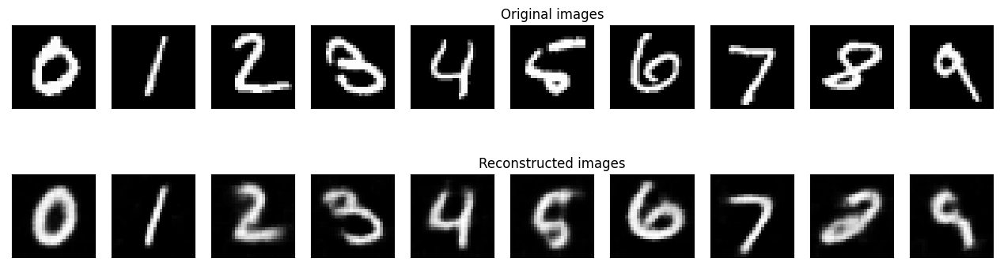

	 partial train loss (single batch): 0.026440
	 partial train loss (single batch): 0.026671
	 partial train loss (single batch): 0.026462
	 partial train loss (single batch): 0.027313
	 partial train loss (single batch): 0.025902
	 partial train loss (single batch): 0.026313
	 partial train loss (single batch): 0.026001
	 partial train loss (single batch): 0.025574
	 partial train loss (single batch): 0.026041
	 partial train loss (single batch): 0.025357
	 partial train loss (single batch): 0.026466
	 partial train loss (single batch): 0.025675
	 partial train loss (single batch): 0.026388
	 partial train loss (single batch): 0.027079
	 partial train loss (single batch): 0.025561
	 partial train loss (single batch): 0.025514
	 partial train loss (single batch): 0.027269
	 partial train loss (single batch): 0.025314
	 partial train loss (single batch): 0.027123
	 partial train loss (single batch): 0.025956
	 partial train loss (single batch): 0.025513
	 partial train loss (single batch

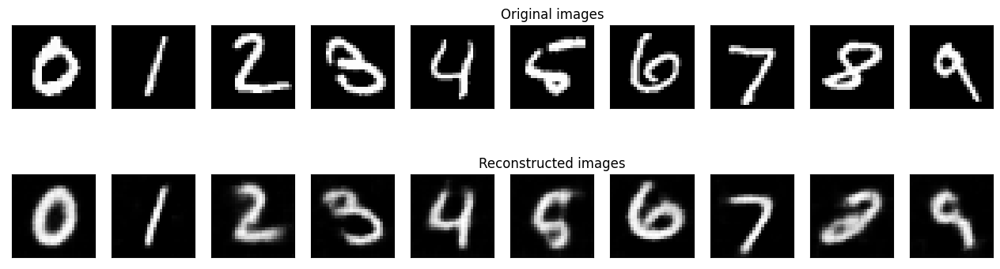

	 partial train loss (single batch): 0.026345
	 partial train loss (single batch): 0.026592
	 partial train loss (single batch): 0.026320
	 partial train loss (single batch): 0.027246
	 partial train loss (single batch): 0.025807
	 partial train loss (single batch): 0.026219
	 partial train loss (single batch): 0.025959
	 partial train loss (single batch): 0.025521
	 partial train loss (single batch): 0.025925
	 partial train loss (single batch): 0.025252
	 partial train loss (single batch): 0.026389
	 partial train loss (single batch): 0.025596
	 partial train loss (single batch): 0.026315
	 partial train loss (single batch): 0.026938
	 partial train loss (single batch): 0.025473
	 partial train loss (single batch): 0.025488
	 partial train loss (single batch): 0.027132
	 partial train loss (single batch): 0.025236
	 partial train loss (single batch): 0.027063
	 partial train loss (single batch): 0.025835
	 partial train loss (single batch): 0.025476
	 partial train loss (single batch

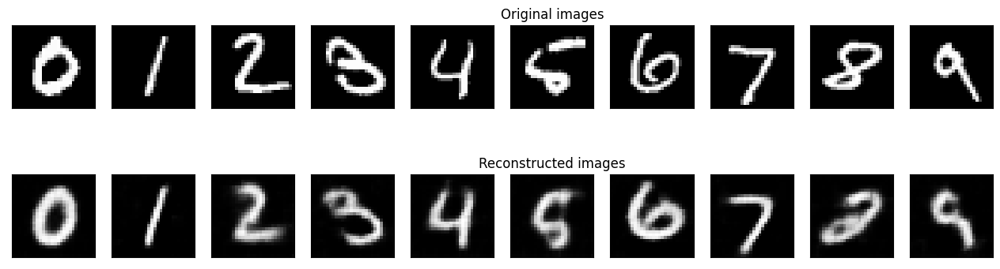

	 partial train loss (single batch): 0.026248
	 partial train loss (single batch): 0.026457
	 partial train loss (single batch): 0.026292
	 partial train loss (single batch): 0.027096
	 partial train loss (single batch): 0.025716
	 partial train loss (single batch): 0.026218
	 partial train loss (single batch): 0.025839
	 partial train loss (single batch): 0.025478
	 partial train loss (single batch): 0.025792
	 partial train loss (single batch): 0.025087
	 partial train loss (single batch): 0.026199
	 partial train loss (single batch): 0.025475
	 partial train loss (single batch): 0.026174
	 partial train loss (single batch): 0.026842
	 partial train loss (single batch): 0.025338
	 partial train loss (single batch): 0.025380
	 partial train loss (single batch): 0.027107
	 partial train loss (single batch): 0.025124
	 partial train loss (single batch): 0.026924
	 partial train loss (single batch): 0.025751
	 partial train loss (single batch): 0.025373
	 partial train loss (single batch

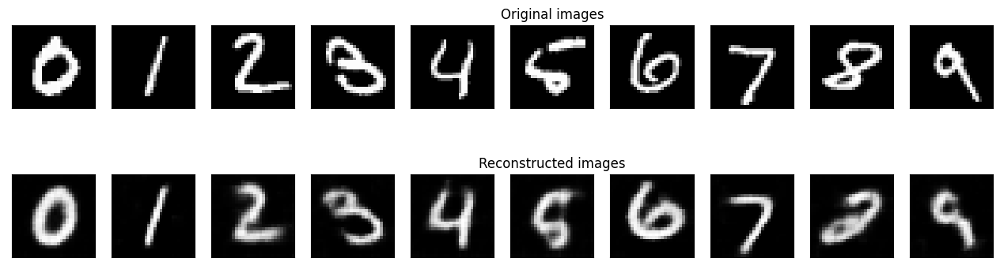

	 partial train loss (single batch): 0.026202
	 partial train loss (single batch): 0.026379
	 partial train loss (single batch): 0.026209
	 partial train loss (single batch): 0.027052
	 partial train loss (single batch): 0.025614
	 partial train loss (single batch): 0.026146
	 partial train loss (single batch): 0.025831
	 partial train loss (single batch): 0.025421
	 partial train loss (single batch): 0.025701
	 partial train loss (single batch): 0.025070
	 partial train loss (single batch): 0.026142
	 partial train loss (single batch): 0.025338
	 partial train loss (single batch): 0.026064
	 partial train loss (single batch): 0.026752
	 partial train loss (single batch): 0.025289
	 partial train loss (single batch): 0.025252
	 partial train loss (single batch): 0.026989
	 partial train loss (single batch): 0.024968
	 partial train loss (single batch): 0.026818
	 partial train loss (single batch): 0.025607
	 partial train loss (single batch): 0.025229
	 partial train loss (single batch

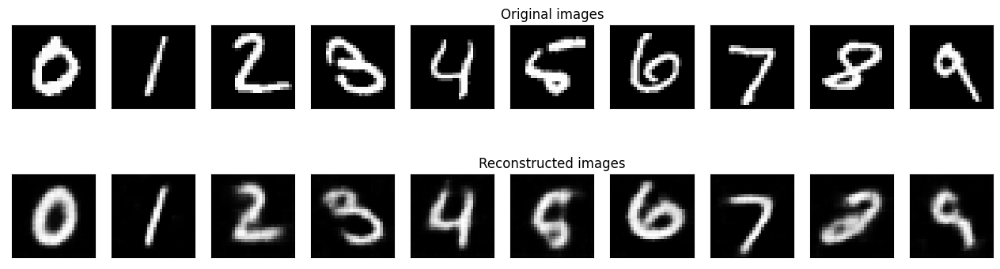

	 partial train loss (single batch): 0.026131
	 partial train loss (single batch): 0.026282
	 partial train loss (single batch): 0.026105
	 partial train loss (single batch): 0.026981
	 partial train loss (single batch): 0.025612
	 partial train loss (single batch): 0.026032
	 partial train loss (single batch): 0.025741
	 partial train loss (single batch): 0.025373
	 partial train loss (single batch): 0.025546
	 partial train loss (single batch): 0.024922
	 partial train loss (single batch): 0.026031
	 partial train loss (single batch): 0.025240
	 partial train loss (single batch): 0.026039
	 partial train loss (single batch): 0.026627
	 partial train loss (single batch): 0.025175
	 partial train loss (single batch): 0.025233
	 partial train loss (single batch): 0.026810
	 partial train loss (single batch): 0.024910
	 partial train loss (single batch): 0.026697
	 partial train loss (single batch): 0.025465
	 partial train loss (single batch): 0.025192
	 partial train loss (single batch

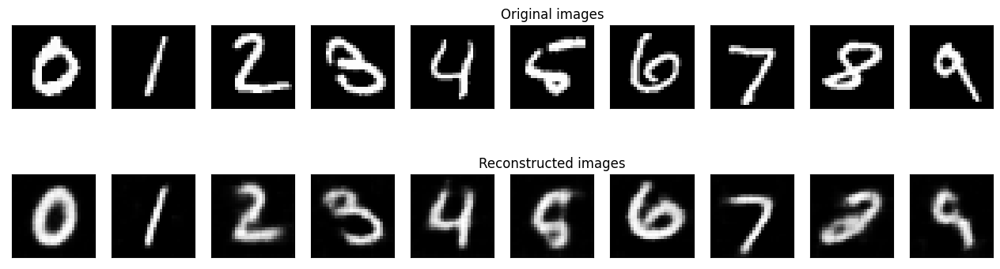

	 partial train loss (single batch): 0.026036
	 partial train loss (single batch): 0.026297
	 partial train loss (single batch): 0.026121
	 partial train loss (single batch): 0.026945
	 partial train loss (single batch): 0.025612
	 partial train loss (single batch): 0.025987
	 partial train loss (single batch): 0.025724
	 partial train loss (single batch): 0.025394
	 partial train loss (single batch): 0.025488
	 partial train loss (single batch): 0.024886
	 partial train loss (single batch): 0.025973
	 partial train loss (single batch): 0.025182
	 partial train loss (single batch): 0.026045
	 partial train loss (single batch): 0.026568
	 partial train loss (single batch): 0.025100
	 partial train loss (single batch): 0.025141
	 partial train loss (single batch): 0.026690
	 partial train loss (single batch): 0.024795
	 partial train loss (single batch): 0.026608
	 partial train loss (single batch): 0.025453
	 partial train loss (single batch): 0.025141
	 partial train loss (single batch

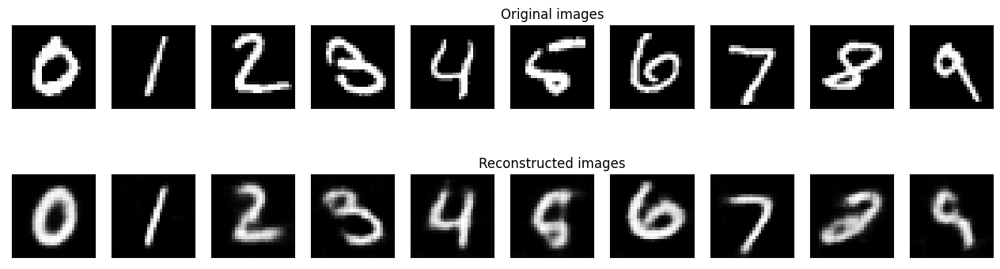

	 partial train loss (single batch): 0.025960
	 partial train loss (single batch): 0.026202
	 partial train loss (single batch): 0.026079
	 partial train loss (single batch): 0.026853
	 partial train loss (single batch): 0.025479
	 partial train loss (single batch): 0.025941
	 partial train loss (single batch): 0.025684
	 partial train loss (single batch): 0.025322
	 partial train loss (single batch): 0.025454
	 partial train loss (single batch): 0.024778
	 partial train loss (single batch): 0.025917
	 partial train loss (single batch): 0.025154
	 partial train loss (single batch): 0.025956
	 partial train loss (single batch): 0.026544
	 partial train loss (single batch): 0.025034
	 partial train loss (single batch): 0.024962
	 partial train loss (single batch): 0.026716
	 partial train loss (single batch): 0.024698
	 partial train loss (single batch): 0.026545
	 partial train loss (single batch): 0.025342
	 partial train loss (single batch): 0.025001
	 partial train loss (single batch

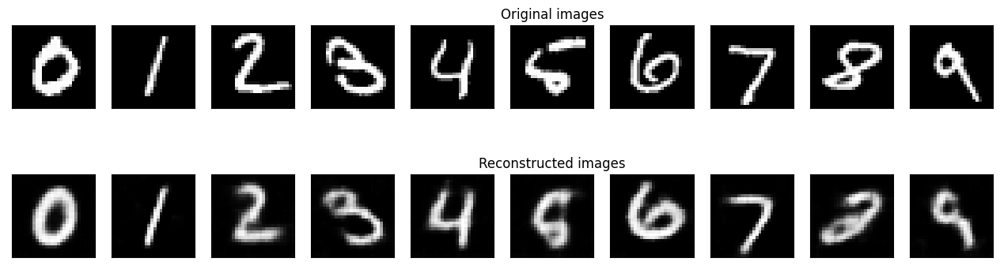

	 partial train loss (single batch): 0.025911
	 partial train loss (single batch): 0.026181
	 partial train loss (single batch): 0.025969
	 partial train loss (single batch): 0.026777
	 partial train loss (single batch): 0.025434
	 partial train loss (single batch): 0.025875
	 partial train loss (single batch): 0.025612
	 partial train loss (single batch): 0.025241
	 partial train loss (single batch): 0.025369
	 partial train loss (single batch): 0.024710
	 partial train loss (single batch): 0.025846
	 partial train loss (single batch): 0.025086
	 partial train loss (single batch): 0.025901
	 partial train loss (single batch): 0.026543
	 partial train loss (single batch): 0.024939
	 partial train loss (single batch): 0.025008
	 partial train loss (single batch): 0.026658
	 partial train loss (single batch): 0.024690
	 partial train loss (single batch): 0.026495
	 partial train loss (single batch): 0.025323
	 partial train loss (single batch): 0.024961
	 partial train loss (single batch

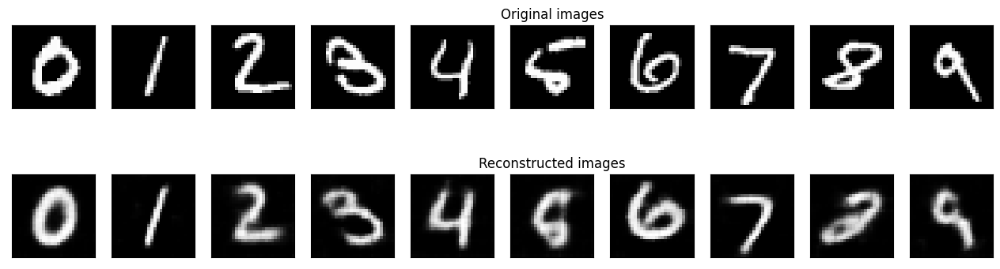

	 partial train loss (single batch): 0.025887
	 partial train loss (single batch): 0.026155
	 partial train loss (single batch): 0.025935
	 partial train loss (single batch): 0.026741
	 partial train loss (single batch): 0.025478
	 partial train loss (single batch): 0.025834
	 partial train loss (single batch): 0.025435
	 partial train loss (single batch): 0.025243
	 partial train loss (single batch): 0.025333
	 partial train loss (single batch): 0.024645
	 partial train loss (single batch): 0.025814
	 partial train loss (single batch): 0.024996
	 partial train loss (single batch): 0.025798
	 partial train loss (single batch): 0.026423
	 partial train loss (single batch): 0.024804
	 partial train loss (single batch): 0.024888
	 partial train loss (single batch): 0.026540
	 partial train loss (single batch): 0.024559
	 partial train loss (single batch): 0.026427
	 partial train loss (single batch): 0.025191
	 partial train loss (single batch): 0.024862
	 partial train loss (single batch

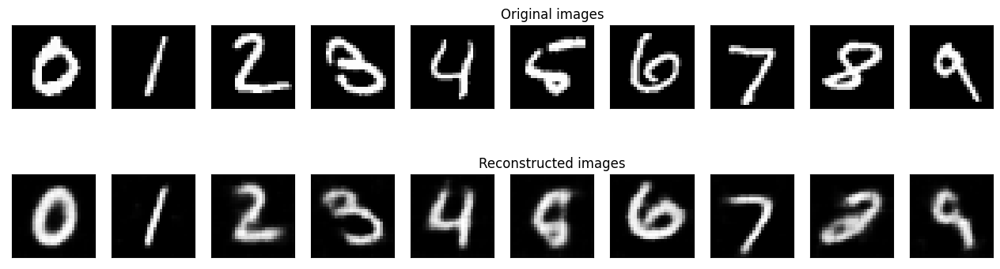

	 partial train loss (single batch): 0.025823
	 partial train loss (single batch): 0.026114
	 partial train loss (single batch): 0.025854
	 partial train loss (single batch): 0.026644
	 partial train loss (single batch): 0.025354
	 partial train loss (single batch): 0.025783
	 partial train loss (single batch): 0.025427
	 partial train loss (single batch): 0.025190
	 partial train loss (single batch): 0.025273
	 partial train loss (single batch): 0.024605
	 partial train loss (single batch): 0.025743
	 partial train loss (single batch): 0.024958
	 partial train loss (single batch): 0.025755
	 partial train loss (single batch): 0.026325
	 partial train loss (single batch): 0.024797
	 partial train loss (single batch): 0.024912
	 partial train loss (single batch): 0.026626
	 partial train loss (single batch): 0.024500
	 partial train loss (single batch): 0.026375
	 partial train loss (single batch): 0.025171
	 partial train loss (single batch): 0.024796
	 partial train loss (single batch

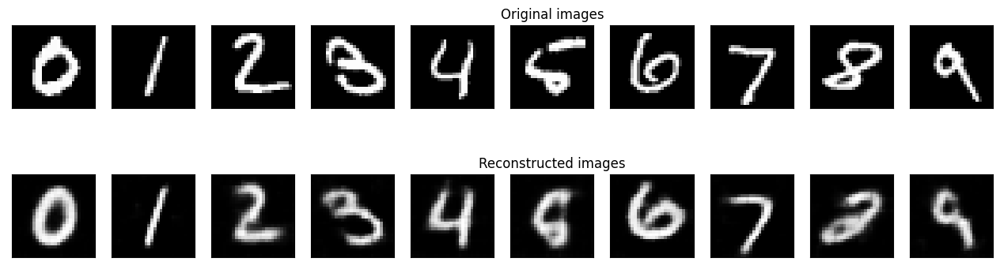

	 partial train loss (single batch): 0.025774
	 partial train loss (single batch): 0.026026
	 partial train loss (single batch): 0.025764
	 partial train loss (single batch): 0.026577
	 partial train loss (single batch): 0.025317
	 partial train loss (single batch): 0.025642
	 partial train loss (single batch): 0.025248
	 partial train loss (single batch): 0.025152
	 partial train loss (single batch): 0.025162
	 partial train loss (single batch): 0.024480
	 partial train loss (single batch): 0.025732
	 partial train loss (single batch): 0.024855
	 partial train loss (single batch): 0.025763
	 partial train loss (single batch): 0.026218
	 partial train loss (single batch): 0.024748
	 partial train loss (single batch): 0.024837
	 partial train loss (single batch): 0.026494
	 partial train loss (single batch): 0.024439
	 partial train loss (single batch): 0.026325
	 partial train loss (single batch): 0.025098
	 partial train loss (single batch): 0.024789
	 partial train loss (single batch

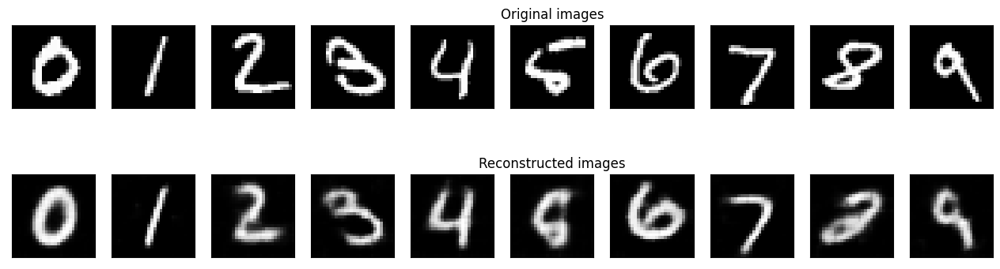

	 partial train loss (single batch): 0.025735
	 partial train loss (single batch): 0.025958
	 partial train loss (single batch): 0.025718
	 partial train loss (single batch): 0.026490
	 partial train loss (single batch): 0.025229
	 partial train loss (single batch): 0.025626
	 partial train loss (single batch): 0.025196
	 partial train loss (single batch): 0.025074
	 partial train loss (single batch): 0.025150
	 partial train loss (single batch): 0.024488
	 partial train loss (single batch): 0.025621
	 partial train loss (single batch): 0.024796
	 partial train loss (single batch): 0.025737
	 partial train loss (single batch): 0.026201
	 partial train loss (single batch): 0.024713
	 partial train loss (single batch): 0.024886
	 partial train loss (single batch): 0.026500
	 partial train loss (single batch): 0.024387
	 partial train loss (single batch): 0.026337
	 partial train loss (single batch): 0.025101
	 partial train loss (single batch): 0.024741
	 partial train loss (single batch

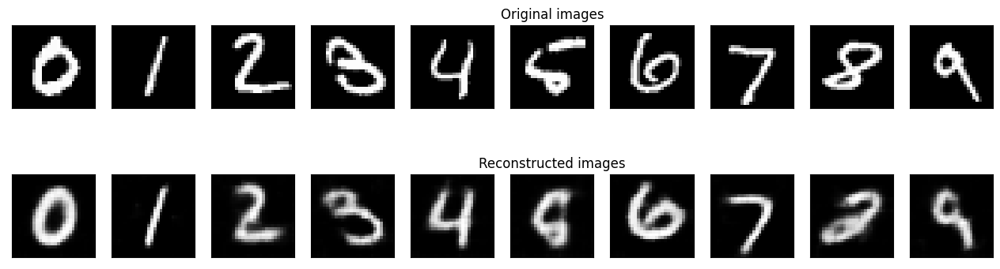

	 partial train loss (single batch): 0.025644
	 partial train loss (single batch): 0.025954
	 partial train loss (single batch): 0.025672
	 partial train loss (single batch): 0.026437
	 partial train loss (single batch): 0.025232
	 partial train loss (single batch): 0.025556
	 partial train loss (single batch): 0.025080
	 partial train loss (single batch): 0.024966
	 partial train loss (single batch): 0.025089
	 partial train loss (single batch): 0.024399
	 partial train loss (single batch): 0.025536
	 partial train loss (single batch): 0.024776
	 partial train loss (single batch): 0.025667
	 partial train loss (single batch): 0.026092
	 partial train loss (single batch): 0.024665
	 partial train loss (single batch): 0.024803
	 partial train loss (single batch): 0.026442
	 partial train loss (single batch): 0.024320
	 partial train loss (single batch): 0.026211
	 partial train loss (single batch): 0.024965
	 partial train loss (single batch): 0.024692
	 partial train loss (single batch

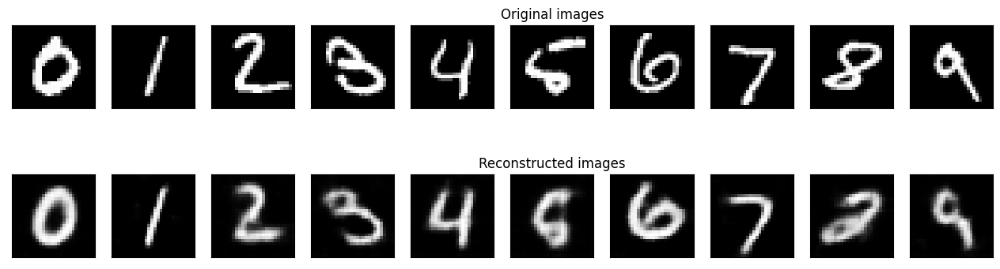

	 partial train loss (single batch): 0.025618
	 partial train loss (single batch): 0.025920
	 partial train loss (single batch): 0.025666
	 partial train loss (single batch): 0.026388
	 partial train loss (single batch): 0.025102
	 partial train loss (single batch): 0.025524
	 partial train loss (single batch): 0.025097
	 partial train loss (single batch): 0.024909
	 partial train loss (single batch): 0.025026
	 partial train loss (single batch): 0.024402
	 partial train loss (single batch): 0.025507
	 partial train loss (single batch): 0.024683
	 partial train loss (single batch): 0.025638
	 partial train loss (single batch): 0.026072
	 partial train loss (single batch): 0.024612
	 partial train loss (single batch): 0.024735
	 partial train loss (single batch): 0.026398
	 partial train loss (single batch): 0.024319
	 partial train loss (single batch): 0.026154
	 partial train loss (single batch): 0.024962
	 partial train loss (single batch): 0.024650
	 partial train loss (single batch

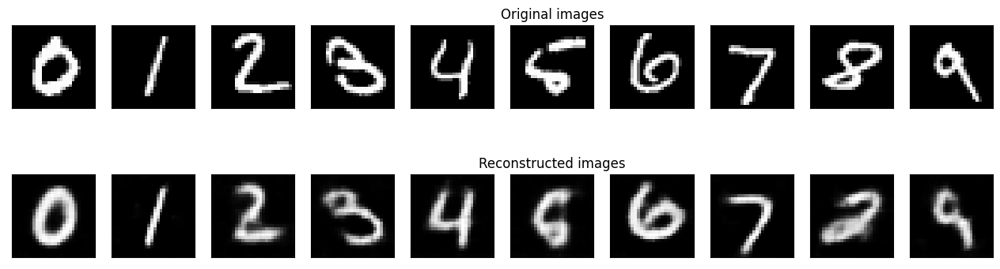

	 partial train loss (single batch): 0.025644
	 partial train loss (single batch): 0.025945
	 partial train loss (single batch): 0.025658
	 partial train loss (single batch): 0.026406
	 partial train loss (single batch): 0.025084
	 partial train loss (single batch): 0.025497
	 partial train loss (single batch): 0.025074
	 partial train loss (single batch): 0.024925
	 partial train loss (single batch): 0.024985
	 partial train loss (single batch): 0.024397
	 partial train loss (single batch): 0.025461
	 partial train loss (single batch): 0.024664
	 partial train loss (single batch): 0.025586
	 partial train loss (single batch): 0.025976
	 partial train loss (single batch): 0.024599
	 partial train loss (single batch): 0.024724
	 partial train loss (single batch): 0.026419
	 partial train loss (single batch): 0.024279
	 partial train loss (single batch): 0.026178
	 partial train loss (single batch): 0.024935
	 partial train loss (single batch): 0.024538
	 partial train loss (single batch

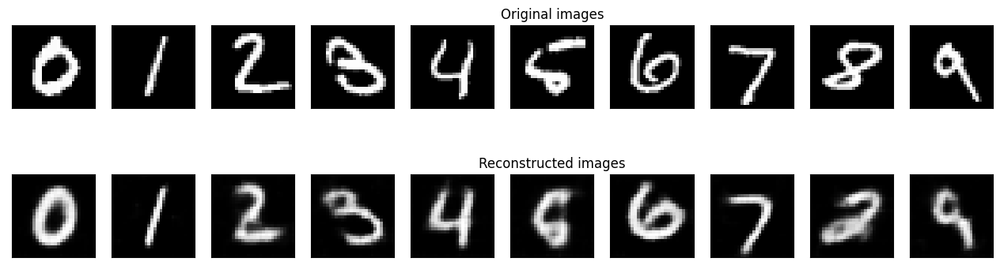

	 partial train loss (single batch): 0.025592
	 partial train loss (single batch): 0.025842
	 partial train loss (single batch): 0.025636
	 partial train loss (single batch): 0.026458
	 partial train loss (single batch): 0.025010
	 partial train loss (single batch): 0.025450
	 partial train loss (single batch): 0.025069
	 partial train loss (single batch): 0.024833
	 partial train loss (single batch): 0.024873
	 partial train loss (single batch): 0.024436
	 partial train loss (single batch): 0.025393
	 partial train loss (single batch): 0.024653
	 partial train loss (single batch): 0.025509
	 partial train loss (single batch): 0.025994
	 partial train loss (single batch): 0.024586
	 partial train loss (single batch): 0.024665
	 partial train loss (single batch): 0.026488
	 partial train loss (single batch): 0.024266
	 partial train loss (single batch): 0.026150
	 partial train loss (single batch): 0.025043
	 partial train loss (single batch): 0.024526
	 partial train loss (single batch

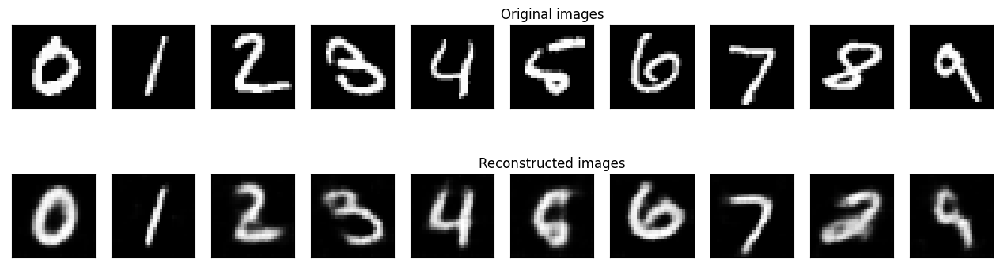

	 partial train loss (single batch): 0.025577
	 partial train loss (single batch): 0.025876
	 partial train loss (single batch): 0.025559
	 partial train loss (single batch): 0.026379
	 partial train loss (single batch): 0.024951
	 partial train loss (single batch): 0.025399
	 partial train loss (single batch): 0.025045
	 partial train loss (single batch): 0.024839
	 partial train loss (single batch): 0.024805
	 partial train loss (single batch): 0.024368
	 partial train loss (single batch): 0.025430
	 partial train loss (single batch): 0.024564
	 partial train loss (single batch): 0.025444
	 partial train loss (single batch): 0.025930
	 partial train loss (single batch): 0.024588
	 partial train loss (single batch): 0.024688
	 partial train loss (single batch): 0.026480
	 partial train loss (single batch): 0.024247
	 partial train loss (single batch): 0.026158
	 partial train loss (single batch): 0.024953
	 partial train loss (single batch): 0.024517
	 partial train loss (single batch

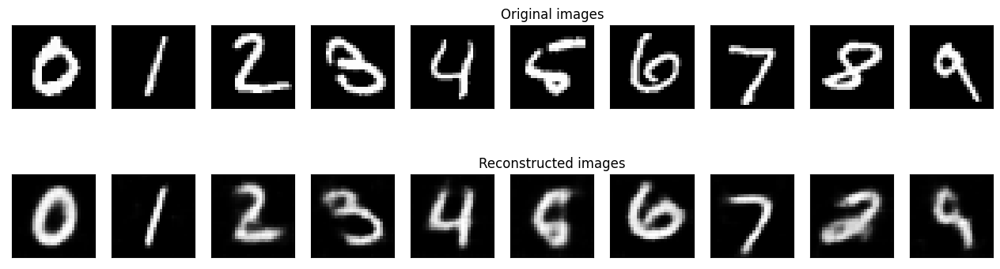

	 partial train loss (single batch): 0.025504
	 partial train loss (single batch): 0.025822
	 partial train loss (single batch): 0.025515
	 partial train loss (single batch): 0.026317
	 partial train loss (single batch): 0.024908
	 partial train loss (single batch): 0.025318
	 partial train loss (single batch): 0.024954
	 partial train loss (single batch): 0.024798
	 partial train loss (single batch): 0.024741
	 partial train loss (single batch): 0.024310
	 partial train loss (single batch): 0.025379
	 partial train loss (single batch): 0.024565
	 partial train loss (single batch): 0.025430
	 partial train loss (single batch): 0.025834
	 partial train loss (single batch): 0.024568
	 partial train loss (single batch): 0.024573
	 partial train loss (single batch): 0.026386
	 partial train loss (single batch): 0.024200
	 partial train loss (single batch): 0.026112
	 partial train loss (single batch): 0.024884
	 partial train loss (single batch): 0.024428
	 partial train loss (single batch

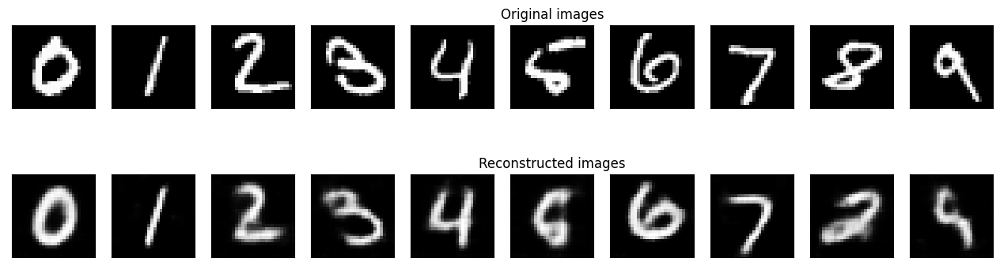

	 partial train loss (single batch): 0.025496
	 partial train loss (single batch): 0.025763
	 partial train loss (single batch): 0.025456
	 partial train loss (single batch): 0.026304
	 partial train loss (single batch): 0.024863
	 partial train loss (single batch): 0.025259
	 partial train loss (single batch): 0.024957
	 partial train loss (single batch): 0.024751
	 partial train loss (single batch): 0.024685
	 partial train loss (single batch): 0.024319
	 partial train loss (single batch): 0.025262
	 partial train loss (single batch): 0.024535
	 partial train loss (single batch): 0.025348
	 partial train loss (single batch): 0.025708
	 partial train loss (single batch): 0.024548
	 partial train loss (single batch): 0.024585
	 partial train loss (single batch): 0.026312
	 partial train loss (single batch): 0.024195
	 partial train loss (single batch): 0.026079
	 partial train loss (single batch): 0.024932
	 partial train loss (single batch): 0.024467
	 partial train loss (single batch

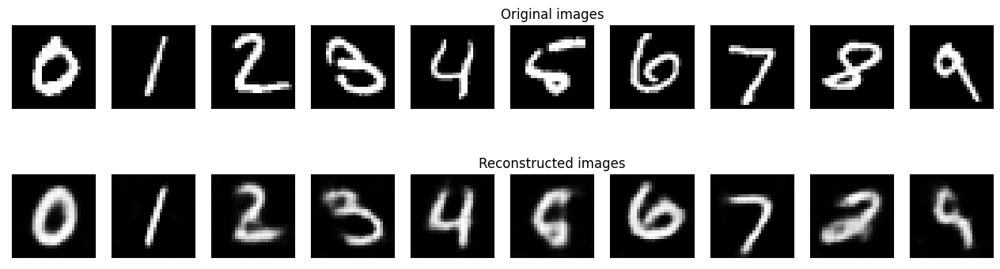

	 partial train loss (single batch): 0.025504
	 partial train loss (single batch): 0.025707
	 partial train loss (single batch): 0.025415
	 partial train loss (single batch): 0.026269
	 partial train loss (single batch): 0.024816
	 partial train loss (single batch): 0.025235
	 partial train loss (single batch): 0.024994
	 partial train loss (single batch): 0.024757
	 partial train loss (single batch): 0.024674
	 partial train loss (single batch): 0.024266
	 partial train loss (single batch): 0.025200
	 partial train loss (single batch): 0.024479
	 partial train loss (single batch): 0.025329
	 partial train loss (single batch): 0.025679
	 partial train loss (single batch): 0.024438
	 partial train loss (single batch): 0.024532
	 partial train loss (single batch): 0.026228
	 partial train loss (single batch): 0.024093
	 partial train loss (single batch): 0.026028
	 partial train loss (single batch): 0.024776
	 partial train loss (single batch): 0.024385
	 partial train loss (single batch

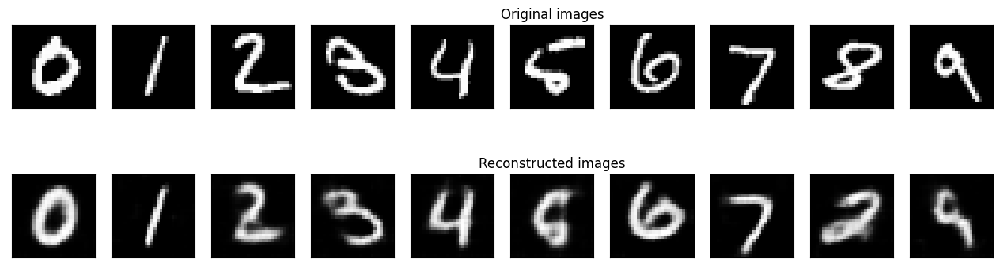

	 partial train loss (single batch): 0.025476
	 partial train loss (single batch): 0.025685
	 partial train loss (single batch): 0.025482
	 partial train loss (single batch): 0.026240
	 partial train loss (single batch): 0.024805
	 partial train loss (single batch): 0.025261
	 partial train loss (single batch): 0.024904
	 partial train loss (single batch): 0.024718
	 partial train loss (single batch): 0.024653
	 partial train loss (single batch): 0.024266
	 partial train loss (single batch): 0.025165
	 partial train loss (single batch): 0.024424
	 partial train loss (single batch): 0.025361
	 partial train loss (single batch): 0.025639
	 partial train loss (single batch): 0.024375
	 partial train loss (single batch): 0.024455
	 partial train loss (single batch): 0.026176
	 partial train loss (single batch): 0.024044
	 partial train loss (single batch): 0.025955
	 partial train loss (single batch): 0.024750
	 partial train loss (single batch): 0.024259
	 partial train loss (single batch

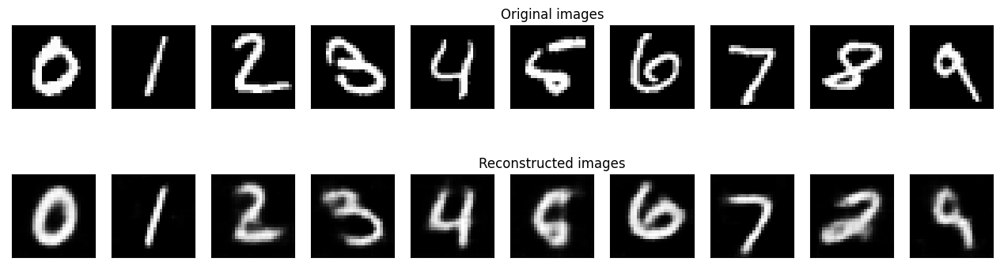

	 partial train loss (single batch): 0.025373
	 partial train loss (single batch): 0.025616
	 partial train loss (single batch): 0.025354
	 partial train loss (single batch): 0.026143
	 partial train loss (single batch): 0.024772
	 partial train loss (single batch): 0.025300
	 partial train loss (single batch): 0.024851
	 partial train loss (single batch): 0.024673
	 partial train loss (single batch): 0.024527
	 partial train loss (single batch): 0.024146
	 partial train loss (single batch): 0.025172
	 partial train loss (single batch): 0.024400
	 partial train loss (single batch): 0.025317
	 partial train loss (single batch): 0.025583
	 partial train loss (single batch): 0.024347
	 partial train loss (single batch): 0.024387
	 partial train loss (single batch): 0.026109
	 partial train loss (single batch): 0.024001
	 partial train loss (single batch): 0.025842
	 partial train loss (single batch): 0.024645
	 partial train loss (single batch): 0.024277
	 partial train loss (single batch

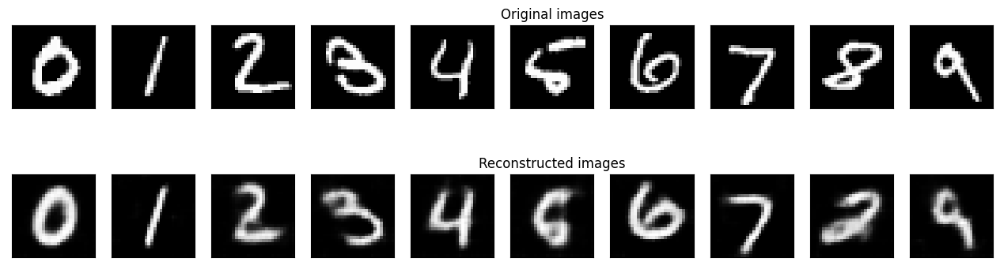

	 partial train loss (single batch): 0.025374
	 partial train loss (single batch): 0.025556
	 partial train loss (single batch): 0.025284
	 partial train loss (single batch): 0.026067
	 partial train loss (single batch): 0.024750
	 partial train loss (single batch): 0.025142
	 partial train loss (single batch): 0.024809
	 partial train loss (single batch): 0.024657
	 partial train loss (single batch): 0.024523
	 partial train loss (single batch): 0.024085
	 partial train loss (single batch): 0.025072
	 partial train loss (single batch): 0.024319
	 partial train loss (single batch): 0.025245
	 partial train loss (single batch): 0.025529
	 partial train loss (single batch): 0.024300
	 partial train loss (single batch): 0.024332
	 partial train loss (single batch): 0.026112
	 partial train loss (single batch): 0.023952
	 partial train loss (single batch): 0.025853
	 partial train loss (single batch): 0.024608
	 partial train loss (single batch): 0.024250
	 partial train loss (single batch

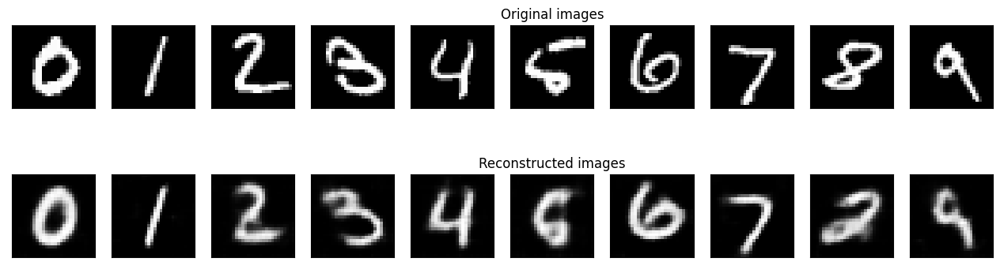

	 partial train loss (single batch): 0.025377
	 partial train loss (single batch): 0.025554
	 partial train loss (single batch): 0.025303
	 partial train loss (single batch): 0.026028
	 partial train loss (single batch): 0.024705
	 partial train loss (single batch): 0.025144
	 partial train loss (single batch): 0.024750
	 partial train loss (single batch): 0.024613
	 partial train loss (single batch): 0.024489
	 partial train loss (single batch): 0.024035
	 partial train loss (single batch): 0.025029
	 partial train loss (single batch): 0.024378
	 partial train loss (single batch): 0.025187
	 partial train loss (single batch): 0.025500
	 partial train loss (single batch): 0.024252
	 partial train loss (single batch): 0.024275
	 partial train loss (single batch): 0.026021
	 partial train loss (single batch): 0.023991
	 partial train loss (single batch): 0.025861
	 partial train loss (single batch): 0.024601
	 partial train loss (single batch): 0.024098
	 partial train loss (single batch

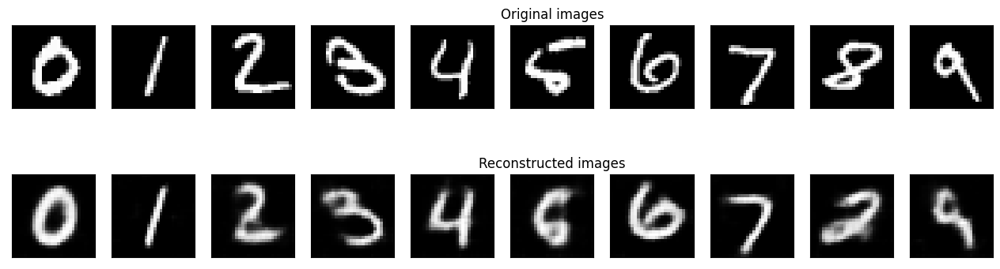

	 partial train loss (single batch): 0.025293
	 partial train loss (single batch): 0.025547
	 partial train loss (single batch): 0.025277
	 partial train loss (single batch): 0.026005
	 partial train loss (single batch): 0.024643
	 partial train loss (single batch): 0.025140
	 partial train loss (single batch): 0.024700
	 partial train loss (single batch): 0.024565
	 partial train loss (single batch): 0.024476
	 partial train loss (single batch): 0.024019
	 partial train loss (single batch): 0.024996
	 partial train loss (single batch): 0.024332
	 partial train loss (single batch): 0.025095
	 partial train loss (single batch): 0.025468
	 partial train loss (single batch): 0.024171
	 partial train loss (single batch): 0.024316
	 partial train loss (single batch): 0.025999
	 partial train loss (single batch): 0.023945
	 partial train loss (single batch): 0.025844
	 partial train loss (single batch): 0.024555
	 partial train loss (single batch): 0.024132
	 partial train loss (single batch

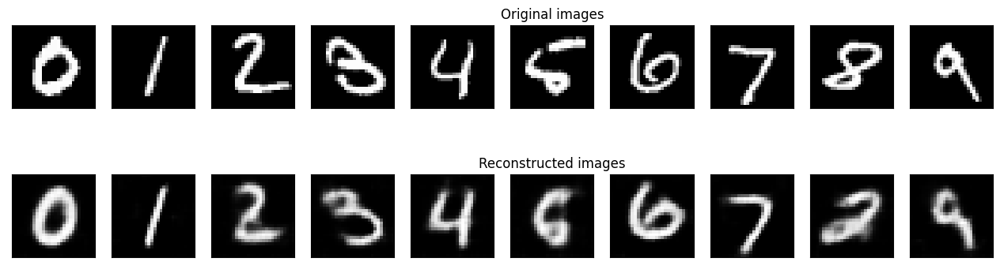

	 partial train loss (single batch): 0.025312
	 partial train loss (single batch): 0.025460
	 partial train loss (single batch): 0.025237
	 partial train loss (single batch): 0.026001
	 partial train loss (single batch): 0.024634
	 partial train loss (single batch): 0.025125
	 partial train loss (single batch): 0.024666
	 partial train loss (single batch): 0.024510
	 partial train loss (single batch): 0.024477
	 partial train loss (single batch): 0.023973
	 partial train loss (single batch): 0.024921
	 partial train loss (single batch): 0.024337
	 partial train loss (single batch): 0.025013
	 partial train loss (single batch): 0.025420
	 partial train loss (single batch): 0.024178
	 partial train loss (single batch): 0.024299
	 partial train loss (single batch): 0.025912
	 partial train loss (single batch): 0.023922
	 partial train loss (single batch): 0.025788
	 partial train loss (single batch): 0.024579
	 partial train loss (single batch): 0.024065
	 partial train loss (single batch

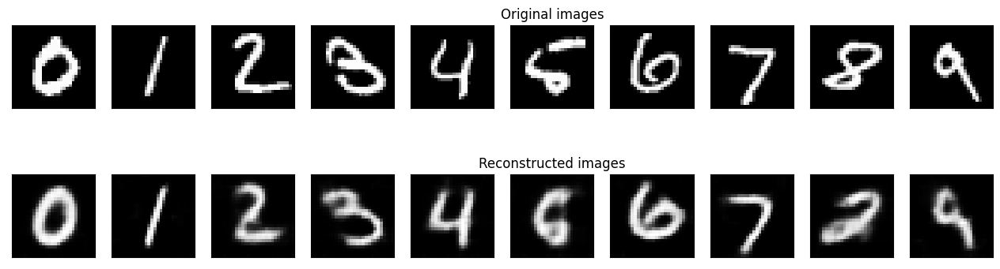

	 partial train loss (single batch): 0.025300
	 partial train loss (single batch): 0.025419
	 partial train loss (single batch): 0.025206
	 partial train loss (single batch): 0.025990
	 partial train loss (single batch): 0.024660
	 partial train loss (single batch): 0.025082
	 partial train loss (single batch): 0.024711
	 partial train loss (single batch): 0.024548
	 partial train loss (single batch): 0.024376
	 partial train loss (single batch): 0.023888
	 partial train loss (single batch): 0.024936
	 partial train loss (single batch): 0.024261
	 partial train loss (single batch): 0.024972
	 partial train loss (single batch): 0.025448
	 partial train loss (single batch): 0.024093
	 partial train loss (single batch): 0.024213
	 partial train loss (single batch): 0.025905
	 partial train loss (single batch): 0.023868
	 partial train loss (single batch): 0.025770
	 partial train loss (single batch): 0.024477
	 partial train loss (single batch): 0.024071
	 partial train loss (single batch

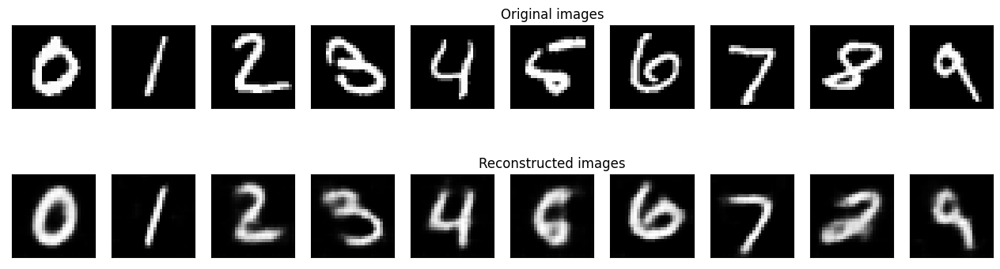

	 partial train loss (single batch): 0.025225
	 partial train loss (single batch): 0.025432
	 partial train loss (single batch): 0.025127
	 partial train loss (single batch): 0.025957
	 partial train loss (single batch): 0.024601
	 partial train loss (single batch): 0.024981
	 partial train loss (single batch): 0.024692
	 partial train loss (single batch): 0.024547
	 partial train loss (single batch): 0.024347
	 partial train loss (single batch): 0.023934
	 partial train loss (single batch): 0.024805
	 partial train loss (single batch): 0.024232
	 partial train loss (single batch): 0.024983
	 partial train loss (single batch): 0.025439
	 partial train loss (single batch): 0.024072
	 partial train loss (single batch): 0.024201
	 partial train loss (single batch): 0.025841
	 partial train loss (single batch): 0.023874
	 partial train loss (single batch): 0.025751
	 partial train loss (single batch): 0.024421
	 partial train loss (single batch): 0.024092
	 partial train loss (single batch

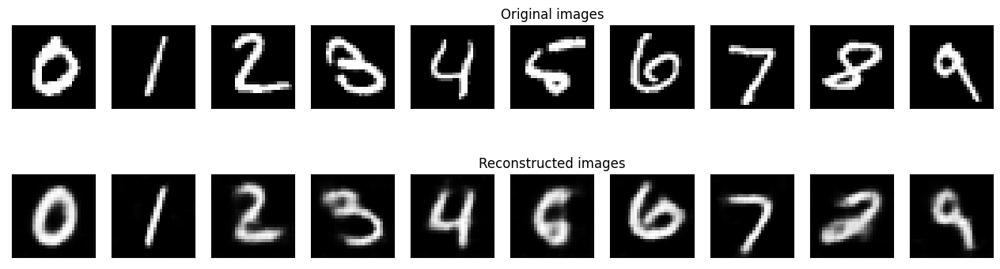

	 partial train loss (single batch): 0.025168
	 partial train loss (single batch): 0.025375
	 partial train loss (single batch): 0.025096
	 partial train loss (single batch): 0.025924
	 partial train loss (single batch): 0.024611
	 partial train loss (single batch): 0.024984
	 partial train loss (single batch): 0.024650
	 partial train loss (single batch): 0.024520
	 partial train loss (single batch): 0.024347
	 partial train loss (single batch): 0.023900
	 partial train loss (single batch): 0.024829
	 partial train loss (single batch): 0.024166
	 partial train loss (single batch): 0.025003
	 partial train loss (single batch): 0.025349
	 partial train loss (single batch): 0.024034
	 partial train loss (single batch): 0.024221
	 partial train loss (single batch): 0.025799
	 partial train loss (single batch): 0.023932
	 partial train loss (single batch): 0.025801
	 partial train loss (single batch): 0.024377
	 partial train loss (single batch): 0.024025
	 partial train loss (single batch

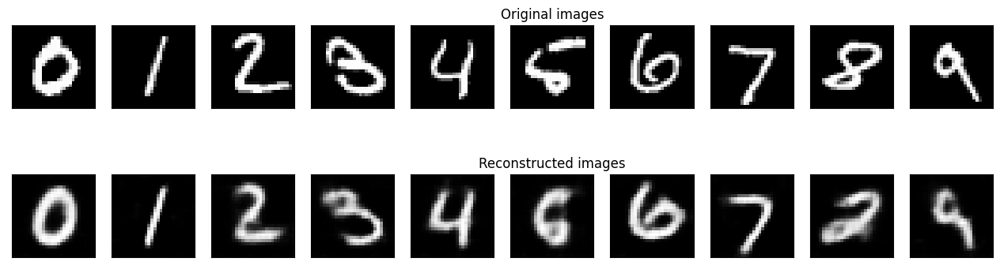

	 partial train loss (single batch): 0.025124
	 partial train loss (single batch): 0.025416
	 partial train loss (single batch): 0.025064
	 partial train loss (single batch): 0.025851
	 partial train loss (single batch): 0.024569
	 partial train loss (single batch): 0.025007
	 partial train loss (single batch): 0.024688
	 partial train loss (single batch): 0.024472
	 partial train loss (single batch): 0.024240
	 partial train loss (single batch): 0.023862
	 partial train loss (single batch): 0.024760
	 partial train loss (single batch): 0.024212
	 partial train loss (single batch): 0.024868
	 partial train loss (single batch): 0.025350
	 partial train loss (single batch): 0.024007
	 partial train loss (single batch): 0.024121
	 partial train loss (single batch): 0.025752
	 partial train loss (single batch): 0.023800
	 partial train loss (single batch): 0.025757
	 partial train loss (single batch): 0.024337
	 partial train loss (single batch): 0.024099
	 partial train loss (single batch

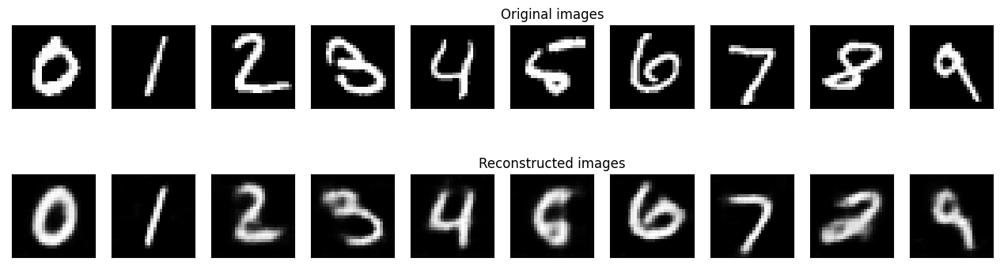

	 partial train loss (single batch): 0.025080
	 partial train loss (single batch): 0.025358
	 partial train loss (single batch): 0.025060
	 partial train loss (single batch): 0.025882
	 partial train loss (single batch): 0.024579
	 partial train loss (single batch): 0.024884
	 partial train loss (single batch): 0.024600
	 partial train loss (single batch): 0.024390
	 partial train loss (single batch): 0.024234
	 partial train loss (single batch): 0.023838
	 partial train loss (single batch): 0.024780
	 partial train loss (single batch): 0.024181
	 partial train loss (single batch): 0.024854
	 partial train loss (single batch): 0.025353
	 partial train loss (single batch): 0.023997
	 partial train loss (single batch): 0.024194
	 partial train loss (single batch): 0.025765
	 partial train loss (single batch): 0.023710
	 partial train loss (single batch): 0.025731
	 partial train loss (single batch): 0.024360
	 partial train loss (single batch): 0.023988
	 partial train loss (single batch

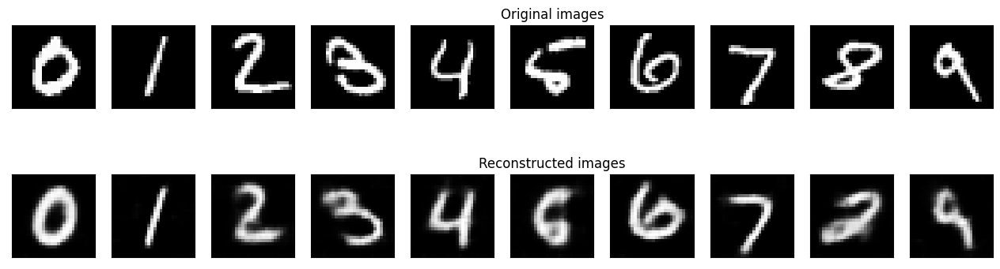

	 partial train loss (single batch): 0.025188
	 partial train loss (single batch): 0.025435
	 partial train loss (single batch): 0.025047
	 partial train loss (single batch): 0.025854
	 partial train loss (single batch): 0.024583
	 partial train loss (single batch): 0.024936
	 partial train loss (single batch): 0.024553
	 partial train loss (single batch): 0.024427
	 partial train loss (single batch): 0.024202
	 partial train loss (single batch): 0.023794
	 partial train loss (single batch): 0.024712
	 partial train loss (single batch): 0.024146
	 partial train loss (single batch): 0.024811
	 partial train loss (single batch): 0.025296
	 partial train loss (single batch): 0.023959
	 partial train loss (single batch): 0.024077
	 partial train loss (single batch): 0.025757
	 partial train loss (single batch): 0.023783
	 partial train loss (single batch): 0.025695
	 partial train loss (single batch): 0.024326
	 partial train loss (single batch): 0.023971
	 partial train loss (single batch

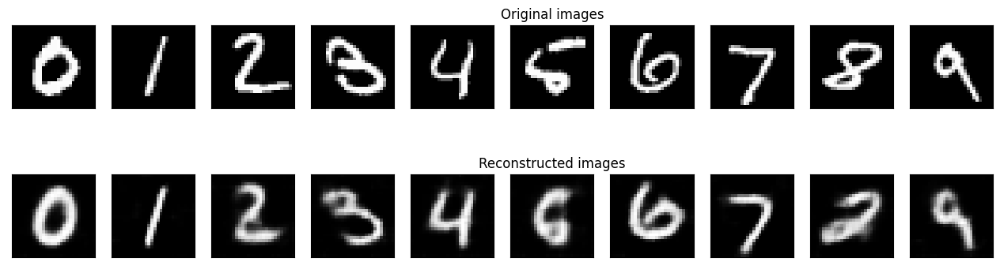

	 partial train loss (single batch): 0.025103
	 partial train loss (single batch): 0.025378
	 partial train loss (single batch): 0.025064
	 partial train loss (single batch): 0.025883
	 partial train loss (single batch): 0.024552
	 partial train loss (single batch): 0.024815
	 partial train loss (single batch): 0.024526
	 partial train loss (single batch): 0.024450
	 partial train loss (single batch): 0.024210
	 partial train loss (single batch): 0.023764
	 partial train loss (single batch): 0.024700
	 partial train loss (single batch): 0.024127
	 partial train loss (single batch): 0.024809
	 partial train loss (single batch): 0.025287
	 partial train loss (single batch): 0.023942
	 partial train loss (single batch): 0.024086
	 partial train loss (single batch): 0.025669
	 partial train loss (single batch): 0.023784
	 partial train loss (single batch): 0.025619
	 partial train loss (single batch): 0.024250
	 partial train loss (single batch): 0.023924
	 partial train loss (single batch

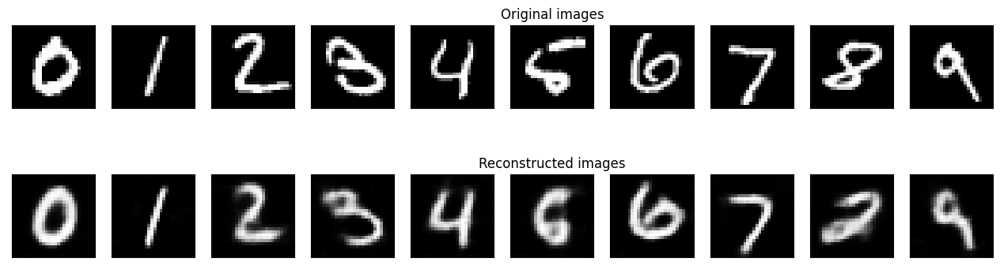

	 partial train loss (single batch): 0.025045
	 partial train loss (single batch): 0.025285
	 partial train loss (single batch): 0.025018
	 partial train loss (single batch): 0.025801
	 partial train loss (single batch): 0.024453
	 partial train loss (single batch): 0.024812
	 partial train loss (single batch): 0.024598
	 partial train loss (single batch): 0.024383
	 partial train loss (single batch): 0.024141
	 partial train loss (single batch): 0.023757
	 partial train loss (single batch): 0.024667
	 partial train loss (single batch): 0.024148
	 partial train loss (single batch): 0.024766
	 partial train loss (single batch): 0.025287
	 partial train loss (single batch): 0.023993
	 partial train loss (single batch): 0.024037
	 partial train loss (single batch): 0.025641
	 partial train loss (single batch): 0.023755
	 partial train loss (single batch): 0.025704
	 partial train loss (single batch): 0.024333
	 partial train loss (single batch): 0.023888
	 partial train loss (single batch

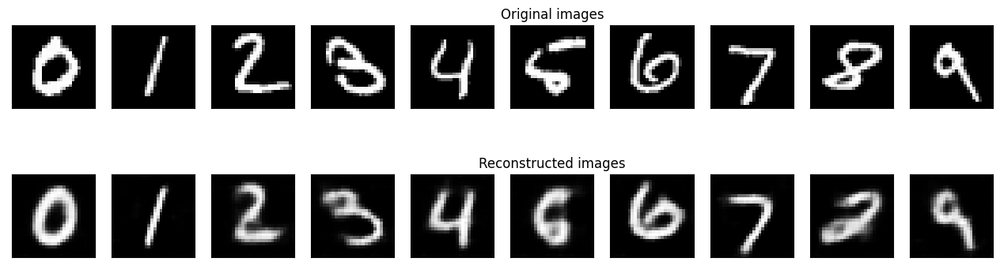

	 partial train loss (single batch): 0.025005
	 partial train loss (single batch): 0.025247
	 partial train loss (single batch): 0.025001
	 partial train loss (single batch): 0.025722
	 partial train loss (single batch): 0.024453
	 partial train loss (single batch): 0.024823
	 partial train loss (single batch): 0.024554
	 partial train loss (single batch): 0.024399
	 partial train loss (single batch): 0.024160
	 partial train loss (single batch): 0.023735
	 partial train loss (single batch): 0.024716
	 partial train loss (single batch): 0.024130
	 partial train loss (single batch): 0.024709
	 partial train loss (single batch): 0.025261
	 partial train loss (single batch): 0.024006
	 partial train loss (single batch): 0.024076
	 partial train loss (single batch): 0.025717
	 partial train loss (single batch): 0.023735
	 partial train loss (single batch): 0.025651
	 partial train loss (single batch): 0.024277
	 partial train loss (single batch): 0.023875
	 partial train loss (single batch

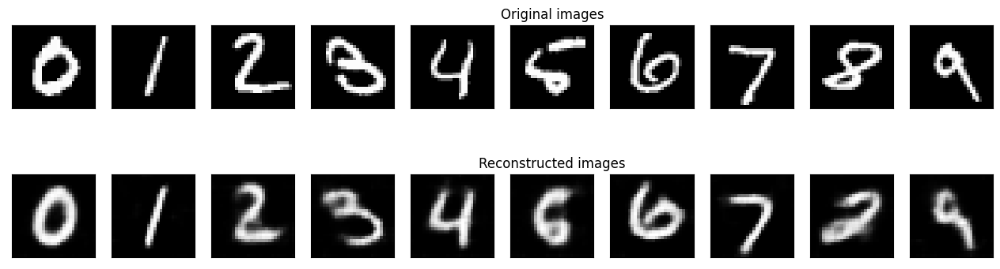

	 partial train loss (single batch): 0.025085
	 partial train loss (single batch): 0.025318
	 partial train loss (single batch): 0.024992
	 partial train loss (single batch): 0.025715
	 partial train loss (single batch): 0.024439
	 partial train loss (single batch): 0.024791
	 partial train loss (single batch): 0.024476
	 partial train loss (single batch): 0.024372
	 partial train loss (single batch): 0.024122
	 partial train loss (single batch): 0.023709
	 partial train loss (single batch): 0.024678
	 partial train loss (single batch): 0.024063
	 partial train loss (single batch): 0.024719
	 partial train loss (single batch): 0.025247
	 partial train loss (single batch): 0.023959
	 partial train loss (single batch): 0.023989
	 partial train loss (single batch): 0.025734
	 partial train loss (single batch): 0.023709
	 partial train loss (single batch): 0.025613
	 partial train loss (single batch): 0.024226
	 partial train loss (single batch): 0.023922
	 partial train loss (single batch

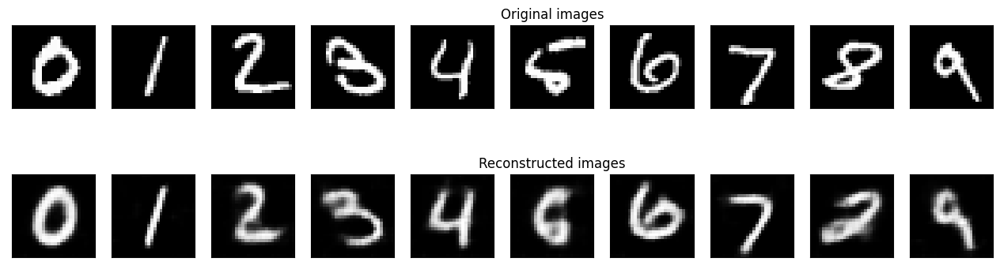

	 partial train loss (single batch): 0.024961
	 partial train loss (single batch): 0.025273
	 partial train loss (single batch): 0.025073
	 partial train loss (single batch): 0.025647
	 partial train loss (single batch): 0.024391
	 partial train loss (single batch): 0.024809
	 partial train loss (single batch): 0.024469
	 partial train loss (single batch): 0.024361
	 partial train loss (single batch): 0.024169
	 partial train loss (single batch): 0.023693
	 partial train loss (single batch): 0.024617
	 partial train loss (single batch): 0.024029
	 partial train loss (single batch): 0.024714
	 partial train loss (single batch): 0.025243
	 partial train loss (single batch): 0.023979
	 partial train loss (single batch): 0.024004
	 partial train loss (single batch): 0.025693
	 partial train loss (single batch): 0.023688
	 partial train loss (single batch): 0.025621
	 partial train loss (single batch): 0.024235
	 partial train loss (single batch): 0.023848
	 partial train loss (single batch

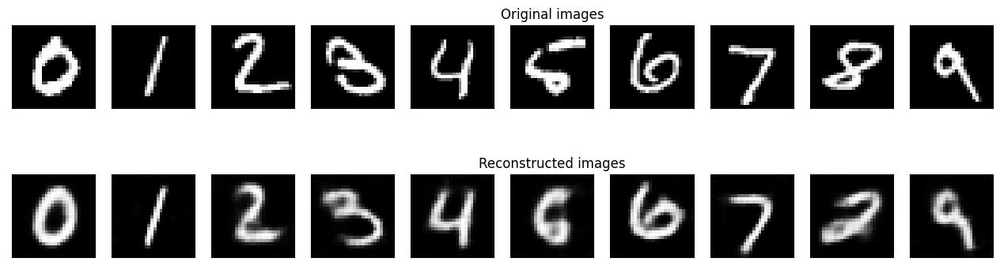

	 partial train loss (single batch): 0.024980
	 partial train loss (single batch): 0.025276
	 partial train loss (single batch): 0.025075
	 partial train loss (single batch): 0.025693
	 partial train loss (single batch): 0.024362
	 partial train loss (single batch): 0.024746
	 partial train loss (single batch): 0.024517
	 partial train loss (single batch): 0.024303
	 partial train loss (single batch): 0.024060
	 partial train loss (single batch): 0.023726
	 partial train loss (single batch): 0.024487
	 partial train loss (single batch): 0.023990
	 partial train loss (single batch): 0.024628
	 partial train loss (single batch): 0.025219
	 partial train loss (single batch): 0.023982
	 partial train loss (single batch): 0.023946
	 partial train loss (single batch): 0.025553
	 partial train loss (single batch): 0.023704
	 partial train loss (single batch): 0.025588
	 partial train loss (single batch): 0.024193
	 partial train loss (single batch): 0.023757
	 partial train loss (single batch

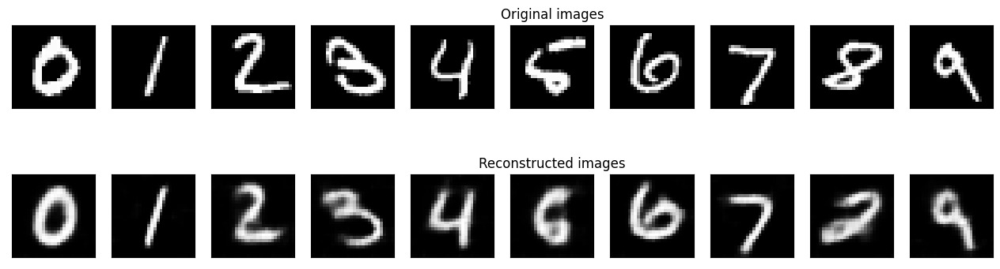

	 partial train loss (single batch): 0.024982
	 partial train loss (single batch): 0.025206
	 partial train loss (single batch): 0.025007
	 partial train loss (single batch): 0.025706
	 partial train loss (single batch): 0.024393
	 partial train loss (single batch): 0.024724
	 partial train loss (single batch): 0.024530
	 partial train loss (single batch): 0.024361
	 partial train loss (single batch): 0.024081
	 partial train loss (single batch): 0.023695
	 partial train loss (single batch): 0.024515
	 partial train loss (single batch): 0.023990
	 partial train loss (single batch): 0.024720
	 partial train loss (single batch): 0.025227
	 partial train loss (single batch): 0.023983
	 partial train loss (single batch): 0.023911
	 partial train loss (single batch): 0.025627
	 partial train loss (single batch): 0.023642
	 partial train loss (single batch): 0.025559
	 partial train loss (single batch): 0.024270
	 partial train loss (single batch): 0.023837
	 partial train loss (single batch

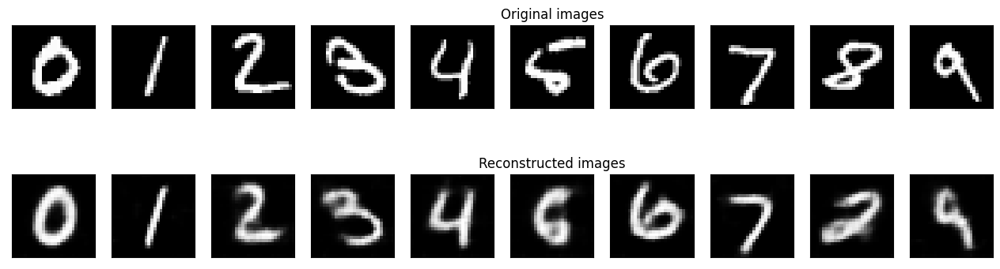

	 partial train loss (single batch): 0.025017
	 partial train loss (single batch): 0.025220
	 partial train loss (single batch): 0.025075
	 partial train loss (single batch): 0.025652
	 partial train loss (single batch): 0.024284
	 partial train loss (single batch): 0.024735
	 partial train loss (single batch): 0.024458
	 partial train loss (single batch): 0.024323
	 partial train loss (single batch): 0.024035
	 partial train loss (single batch): 0.023653
	 partial train loss (single batch): 0.024495
	 partial train loss (single batch): 0.023928
	 partial train loss (single batch): 0.024658
	 partial train loss (single batch): 0.025176
	 partial train loss (single batch): 0.023923
	 partial train loss (single batch): 0.023917
	 partial train loss (single batch): 0.025548
	 partial train loss (single batch): 0.023642
	 partial train loss (single batch): 0.025632
	 partial train loss (single batch): 0.024149
	 partial train loss (single batch): 0.023849
	 partial train loss (single batch

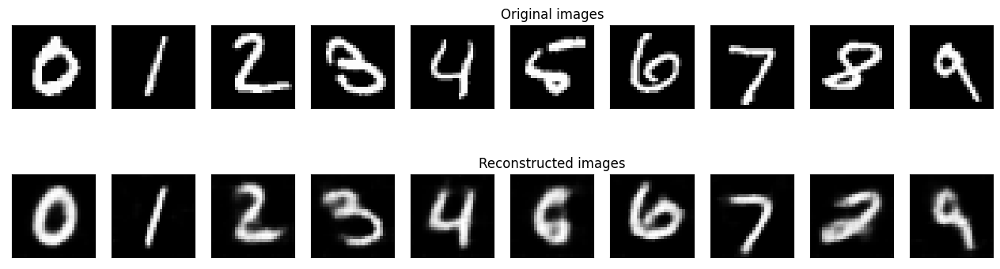

	 partial train loss (single batch): 0.024920
	 partial train loss (single batch): 0.025146
	 partial train loss (single batch): 0.025000
	 partial train loss (single batch): 0.025648
	 partial train loss (single batch): 0.024268
	 partial train loss (single batch): 0.024769
	 partial train loss (single batch): 0.024433
	 partial train loss (single batch): 0.024287
	 partial train loss (single batch): 0.024061
	 partial train loss (single batch): 0.023621
	 partial train loss (single batch): 0.024468
	 partial train loss (single batch): 0.023958
	 partial train loss (single batch): 0.024660
	 partial train loss (single batch): 0.025189
	 partial train loss (single batch): 0.023912
	 partial train loss (single batch): 0.023910
	 partial train loss (single batch): 0.025683
	 partial train loss (single batch): 0.023628
	 partial train loss (single batch): 0.025632
	 partial train loss (single batch): 0.024224
	 partial train loss (single batch): 0.023782
	 partial train loss (single batch

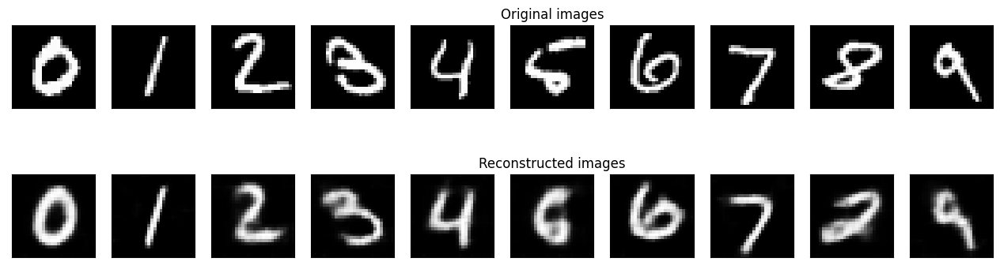

	 partial train loss (single batch): 0.024952
	 partial train loss (single batch): 0.025144
	 partial train loss (single batch): 0.024986
	 partial train loss (single batch): 0.025653
	 partial train loss (single batch): 0.024253
	 partial train loss (single batch): 0.024797
	 partial train loss (single batch): 0.024493
	 partial train loss (single batch): 0.024409
	 partial train loss (single batch): 0.023978
	 partial train loss (single batch): 0.023601
	 partial train loss (single batch): 0.024523
	 partial train loss (single batch): 0.024068
	 partial train loss (single batch): 0.024519
	 partial train loss (single batch): 0.025270
	 partial train loss (single batch): 0.023960
	 partial train loss (single batch): 0.023940
	 partial train loss (single batch): 0.025610
	 partial train loss (single batch): 0.023730
	 partial train loss (single batch): 0.025610
	 partial train loss (single batch): 0.024286
	 partial train loss (single batch): 0.023688
	 partial train loss (single batch

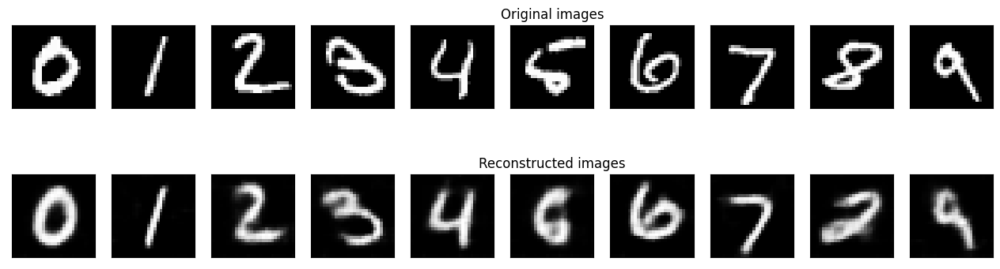

	 partial train loss (single batch): 0.024971
	 partial train loss (single batch): 0.025138
	 partial train loss (single batch): 0.025009
	 partial train loss (single batch): 0.025583
	 partial train loss (single batch): 0.024268
	 partial train loss (single batch): 0.024787
	 partial train loss (single batch): 0.024538
	 partial train loss (single batch): 0.024337
	 partial train loss (single batch): 0.024055
	 partial train loss (single batch): 0.023586
	 partial train loss (single batch): 0.024444
	 partial train loss (single batch): 0.024103
	 partial train loss (single batch): 0.024617
	 partial train loss (single batch): 0.025226
	 partial train loss (single batch): 0.023963
	 partial train loss (single batch): 0.023903
	 partial train loss (single batch): 0.025646
	 partial train loss (single batch): 0.023758
	 partial train loss (single batch): 0.025611
	 partial train loss (single batch): 0.024242
	 partial train loss (single batch): 0.023761
	 partial train loss (single batch

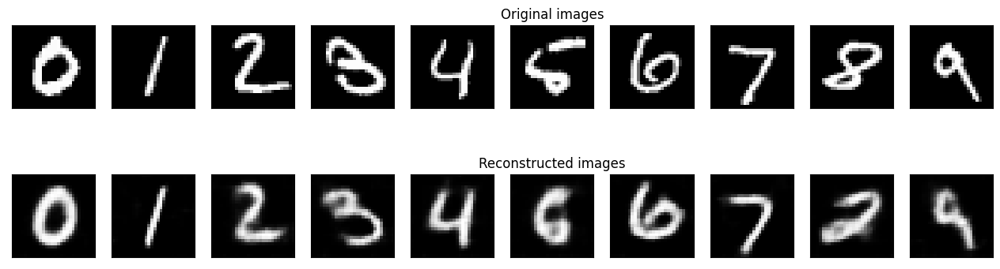

	 partial train loss (single batch): 0.024865
	 partial train loss (single batch): 0.025132
	 partial train loss (single batch): 0.025015
	 partial train loss (single batch): 0.025578
	 partial train loss (single batch): 0.024112
	 partial train loss (single batch): 0.024792
	 partial train loss (single batch): 0.024474
	 partial train loss (single batch): 0.024341
	 partial train loss (single batch): 0.024078
	 partial train loss (single batch): 0.023608
	 partial train loss (single batch): 0.024398
	 partial train loss (single batch): 0.023988
	 partial train loss (single batch): 0.024633
	 partial train loss (single batch): 0.025177
	 partial train loss (single batch): 0.023921
	 partial train loss (single batch): 0.023953
	 partial train loss (single batch): 0.025709
	 partial train loss (single batch): 0.023684
	 partial train loss (single batch): 0.025599
	 partial train loss (single batch): 0.024279
	 partial train loss (single batch): 0.023763
	 partial train loss (single batch

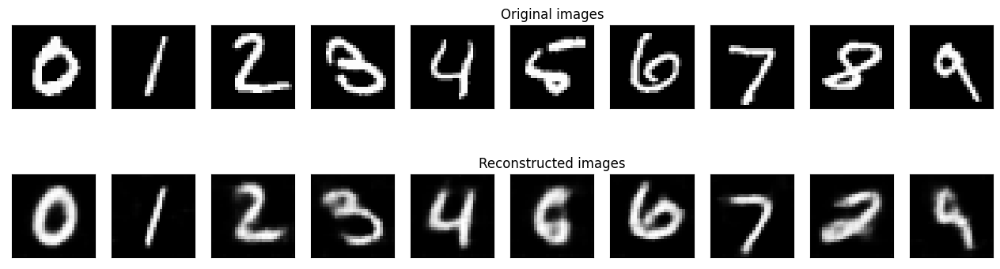

	 partial train loss (single batch): 0.024869
	 partial train loss (single batch): 0.025128
	 partial train loss (single batch): 0.025035
	 partial train loss (single batch): 0.025571
	 partial train loss (single batch): 0.024213
	 partial train loss (single batch): 0.024776
	 partial train loss (single batch): 0.024462
	 partial train loss (single batch): 0.024381
	 partial train loss (single batch): 0.024078
	 partial train loss (single batch): 0.023619
	 partial train loss (single batch): 0.024406
	 partial train loss (single batch): 0.023989
	 partial train loss (single batch): 0.024624
	 partial train loss (single batch): 0.025217
	 partial train loss (single batch): 0.023923
	 partial train loss (single batch): 0.023942
	 partial train loss (single batch): 0.025750
	 partial train loss (single batch): 0.023689
	 partial train loss (single batch): 0.025492
	 partial train loss (single batch): 0.024214
	 partial train loss (single batch): 0.023763
	 partial train loss (single batch

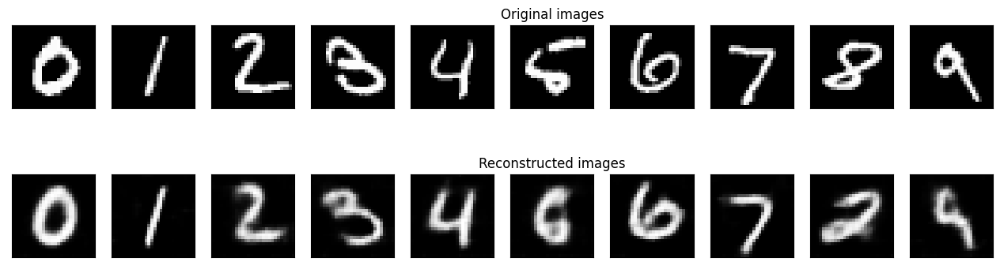

	 partial train loss (single batch): 0.024843
	 partial train loss (single batch): 0.025125
	 partial train loss (single batch): 0.024981
	 partial train loss (single batch): 0.025649
	 partial train loss (single batch): 0.024245
	 partial train loss (single batch): 0.024847
	 partial train loss (single batch): 0.024435
	 partial train loss (single batch): 0.024312
	 partial train loss (single batch): 0.024114
	 partial train loss (single batch): 0.023629
	 partial train loss (single batch): 0.024373
	 partial train loss (single batch): 0.023986
	 partial train loss (single batch): 0.024655
	 partial train loss (single batch): 0.025240
	 partial train loss (single batch): 0.023827
	 partial train loss (single batch): 0.023911
	 partial train loss (single batch): 0.025776
	 partial train loss (single batch): 0.023712
	 partial train loss (single batch): 0.025421
	 partial train loss (single batch): 0.024153
	 partial train loss (single batch): 0.023760
	 partial train loss (single batch

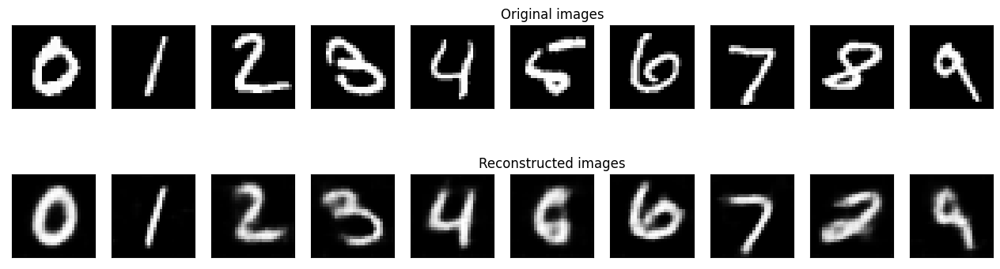

	 partial train loss (single batch): 0.024816
	 partial train loss (single batch): 0.025074
	 partial train loss (single batch): 0.024976
	 partial train loss (single batch): 0.025734
	 partial train loss (single batch): 0.024252
	 partial train loss (single batch): 0.024823
	 partial train loss (single batch): 0.024485
	 partial train loss (single batch): 0.024238
	 partial train loss (single batch): 0.024080
	 partial train loss (single batch): 0.023593
	 partial train loss (single batch): 0.024271
	 partial train loss (single batch): 0.024003
	 partial train loss (single batch): 0.024576
	 partial train loss (single batch): 0.025248
	 partial train loss (single batch): 0.023824
	 partial train loss (single batch): 0.023767
	 partial train loss (single batch): 0.025847
	 partial train loss (single batch): 0.023629
	 partial train loss (single batch): 0.025346
	 partial train loss (single batch): 0.024107
	 partial train loss (single batch): 0.023714
	 partial train loss (single batch

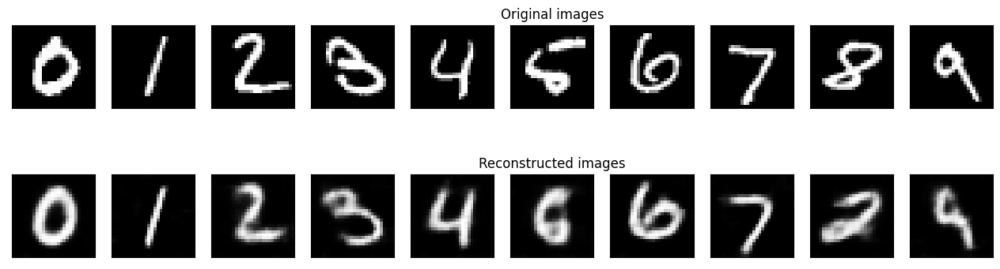

	 partial train loss (single batch): 0.024725
	 partial train loss (single batch): 0.025063
	 partial train loss (single batch): 0.024850
	 partial train loss (single batch): 0.025566
	 partial train loss (single batch): 0.024171
	 partial train loss (single batch): 0.024741
	 partial train loss (single batch): 0.024409
	 partial train loss (single batch): 0.024184
	 partial train loss (single batch): 0.023987
	 partial train loss (single batch): 0.023544
	 partial train loss (single batch): 0.024197
	 partial train loss (single batch): 0.023907
	 partial train loss (single batch): 0.024489
	 partial train loss (single batch): 0.025186
	 partial train loss (single batch): 0.023700
	 partial train loss (single batch): 0.023744
	 partial train loss (single batch): 0.025750
	 partial train loss (single batch): 0.023675
	 partial train loss (single batch): 0.025297
	 partial train loss (single batch): 0.024042
	 partial train loss (single batch): 0.023646
	 partial train loss (single batch

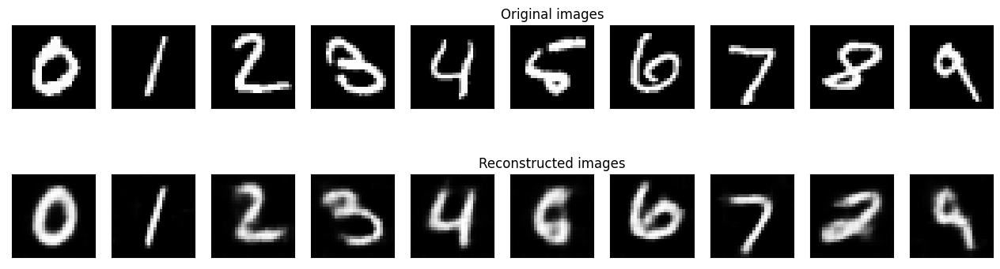

	 partial train loss (single batch): 0.024767
	 partial train loss (single batch): 0.025090
	 partial train loss (single batch): 0.024878
	 partial train loss (single batch): 0.025543
	 partial train loss (single batch): 0.024220
	 partial train loss (single batch): 0.024707
	 partial train loss (single batch): 0.024339
	 partial train loss (single batch): 0.024170
	 partial train loss (single batch): 0.024044
	 partial train loss (single batch): 0.023543
	 partial train loss (single batch): 0.024210
	 partial train loss (single batch): 0.023928
	 partial train loss (single batch): 0.024500
	 partial train loss (single batch): 0.025164
	 partial train loss (single batch): 0.023726
	 partial train loss (single batch): 0.023711
	 partial train loss (single batch): 0.025687
	 partial train loss (single batch): 0.023637
	 partial train loss (single batch): 0.025321
	 partial train loss (single batch): 0.024017
	 partial train loss (single batch): 0.023565
	 partial train loss (single batch

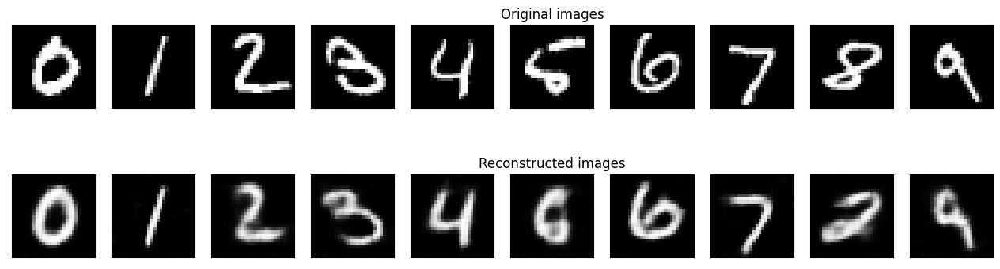

	 partial train loss (single batch): 0.024691
	 partial train loss (single batch): 0.025050
	 partial train loss (single batch): 0.024836
	 partial train loss (single batch): 0.025545
	 partial train loss (single batch): 0.024140
	 partial train loss (single batch): 0.024732
	 partial train loss (single batch): 0.024421
	 partial train loss (single batch): 0.024169
	 partial train loss (single batch): 0.023917
	 partial train loss (single batch): 0.023501
	 partial train loss (single batch): 0.024227
	 partial train loss (single batch): 0.023789
	 partial train loss (single batch): 0.024451
	 partial train loss (single batch): 0.025106
	 partial train loss (single batch): 0.023609
	 partial train loss (single batch): 0.023732
	 partial train loss (single batch): 0.025670
	 partial train loss (single batch): 0.023683
	 partial train loss (single batch): 0.025306
	 partial train loss (single batch): 0.023995
	 partial train loss (single batch): 0.023595
	 partial train loss (single batch

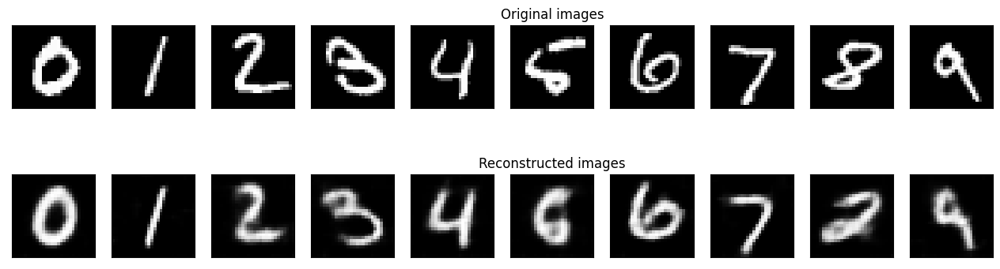

	 partial train loss (single batch): 0.024685
	 partial train loss (single batch): 0.025007
	 partial train loss (single batch): 0.024822
	 partial train loss (single batch): 0.025461
	 partial train loss (single batch): 0.024057
	 partial train loss (single batch): 0.024701
	 partial train loss (single batch): 0.024282
	 partial train loss (single batch): 0.024123
	 partial train loss (single batch): 0.023870
	 partial train loss (single batch): 0.023490
	 partial train loss (single batch): 0.024133
	 partial train loss (single batch): 0.023816
	 partial train loss (single batch): 0.024461
	 partial train loss (single batch): 0.025091
	 partial train loss (single batch): 0.023645
	 partial train loss (single batch): 0.023718
	 partial train loss (single batch): 0.025557
	 partial train loss (single batch): 0.023615
	 partial train loss (single batch): 0.025271
	 partial train loss (single batch): 0.024027
	 partial train loss (single batch): 0.023604
	 partial train loss (single batch

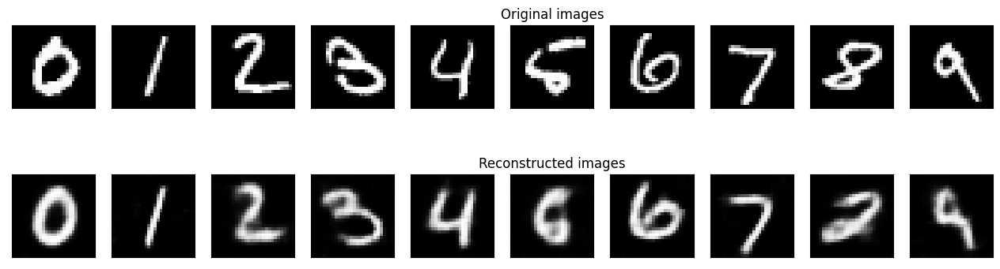

	 partial train loss (single batch): 0.024700
	 partial train loss (single batch): 0.024996
	 partial train loss (single batch): 0.024741
	 partial train loss (single batch): 0.025503
	 partial train loss (single batch): 0.024102
	 partial train loss (single batch): 0.024639
	 partial train loss (single batch): 0.024364
	 partial train loss (single batch): 0.024164
	 partial train loss (single batch): 0.023818
	 partial train loss (single batch): 0.023477
	 partial train loss (single batch): 0.024102
	 partial train loss (single batch): 0.023749
	 partial train loss (single batch): 0.024437
	 partial train loss (single batch): 0.024976
	 partial train loss (single batch): 0.023553
	 partial train loss (single batch): 0.023684
	 partial train loss (single batch): 0.025474
	 partial train loss (single batch): 0.023564
	 partial train loss (single batch): 0.025264
	 partial train loss (single batch): 0.023943
	 partial train loss (single batch): 0.023594
	 partial train loss (single batch

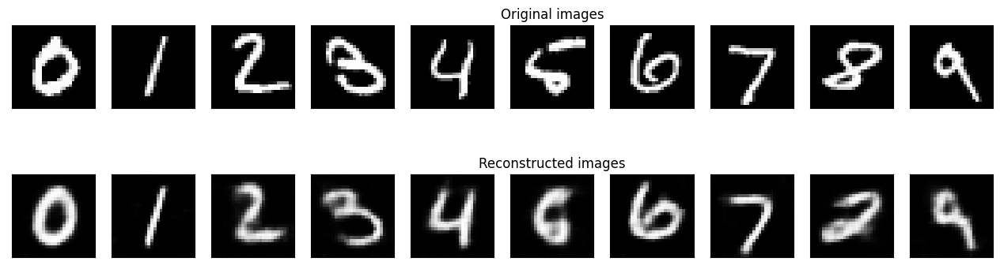

	 partial train loss (single batch): 0.024665
	 partial train loss (single batch): 0.024915
	 partial train loss (single batch): 0.024729
	 partial train loss (single batch): 0.025436
	 partial train loss (single batch): 0.024078
	 partial train loss (single batch): 0.024675
	 partial train loss (single batch): 0.024206
	 partial train loss (single batch): 0.024183
	 partial train loss (single batch): 0.023790
	 partial train loss (single batch): 0.023439
	 partial train loss (single batch): 0.024062
	 partial train loss (single batch): 0.023724
	 partial train loss (single batch): 0.024395
	 partial train loss (single batch): 0.024973
	 partial train loss (single batch): 0.023533
	 partial train loss (single batch): 0.023630
	 partial train loss (single batch): 0.025482
	 partial train loss (single batch): 0.023565
	 partial train loss (single batch): 0.025336
	 partial train loss (single batch): 0.023887
	 partial train loss (single batch): 0.023582
	 partial train loss (single batch

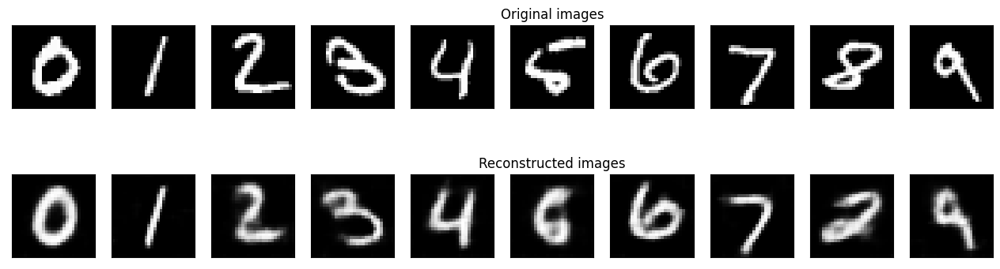

	 partial train loss (single batch): 0.024659
	 partial train loss (single batch): 0.025007
	 partial train loss (single batch): 0.024770
	 partial train loss (single batch): 0.025401
	 partial train loss (single batch): 0.024051
	 partial train loss (single batch): 0.024664
	 partial train loss (single batch): 0.024224
	 partial train loss (single batch): 0.024104
	 partial train loss (single batch): 0.023856
	 partial train loss (single batch): 0.023508
	 partial train loss (single batch): 0.024120
	 partial train loss (single batch): 0.023733
	 partial train loss (single batch): 0.024384
	 partial train loss (single batch): 0.024967
	 partial train loss (single batch): 0.023541
	 partial train loss (single batch): 0.023688
	 partial train loss (single batch): 0.025514
	 partial train loss (single batch): 0.023543
	 partial train loss (single batch): 0.025336
	 partial train loss (single batch): 0.023956
	 partial train loss (single batch): 0.023607
	 partial train loss (single batch

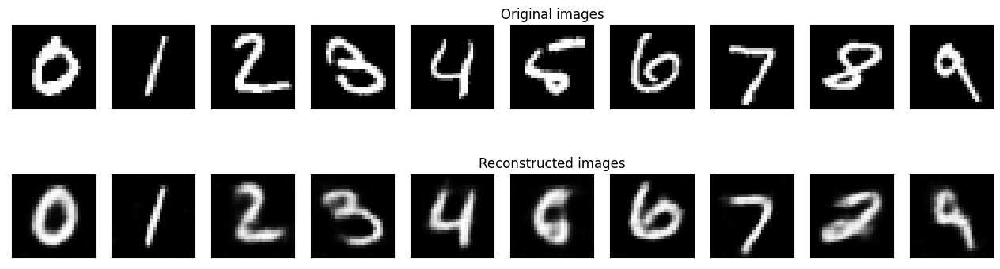

	 partial train loss (single batch): 0.024624
	 partial train loss (single batch): 0.024981
	 partial train loss (single batch): 0.024671
	 partial train loss (single batch): 0.025411
	 partial train loss (single batch): 0.024016
	 partial train loss (single batch): 0.024568
	 partial train loss (single batch): 0.024179
	 partial train loss (single batch): 0.024032
	 partial train loss (single batch): 0.023822
	 partial train loss (single batch): 0.023449
	 partial train loss (single batch): 0.024066
	 partial train loss (single batch): 0.023771
	 partial train loss (single batch): 0.024396
	 partial train loss (single batch): 0.024994
	 partial train loss (single batch): 0.023517
	 partial train loss (single batch): 0.023610
	 partial train loss (single batch): 0.025468
	 partial train loss (single batch): 0.023484
	 partial train loss (single batch): 0.025217
	 partial train loss (single batch): 0.023928
	 partial train loss (single batch): 0.023554
	 partial train loss (single batch

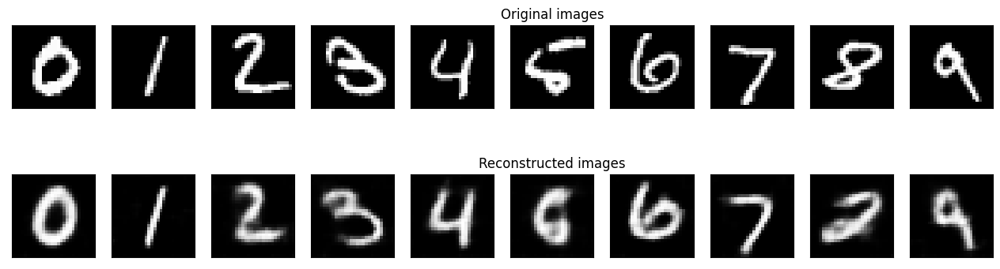

	 partial train loss (single batch): 0.024571
	 partial train loss (single batch): 0.024963
	 partial train loss (single batch): 0.024812
	 partial train loss (single batch): 0.025448
	 partial train loss (single batch): 0.024029
	 partial train loss (single batch): 0.024583
	 partial train loss (single batch): 0.024133
	 partial train loss (single batch): 0.024073
	 partial train loss (single batch): 0.023806
	 partial train loss (single batch): 0.023487
	 partial train loss (single batch): 0.024091
	 partial train loss (single batch): 0.023667
	 partial train loss (single batch): 0.024404
	 partial train loss (single batch): 0.024998
	 partial train loss (single batch): 0.023507
	 partial train loss (single batch): 0.023565
	 partial train loss (single batch): 0.025454
	 partial train loss (single batch): 0.023554
	 partial train loss (single batch): 0.025217
	 partial train loss (single batch): 0.023911
	 partial train loss (single batch): 0.023605
	 partial train loss (single batch

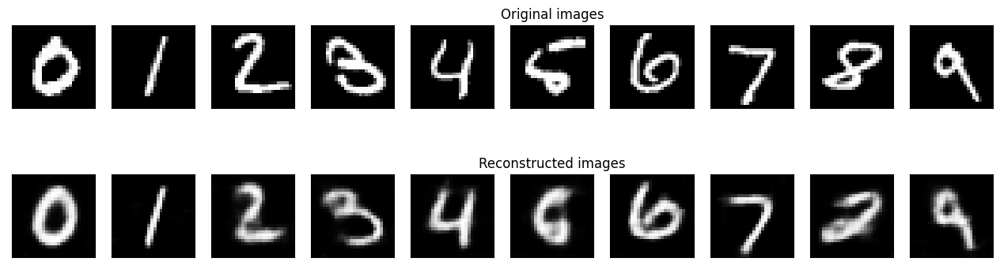

	 partial train loss (single batch): 0.024609
	 partial train loss (single batch): 0.024871
	 partial train loss (single batch): 0.024809
	 partial train loss (single batch): 0.025524
	 partial train loss (single batch): 0.024064
	 partial train loss (single batch): 0.024527
	 partial train loss (single batch): 0.024173
	 partial train loss (single batch): 0.024156
	 partial train loss (single batch): 0.023846
	 partial train loss (single batch): 0.023452
	 partial train loss (single batch): 0.024063
	 partial train loss (single batch): 0.023719
	 partial train loss (single batch): 0.024386
	 partial train loss (single batch): 0.024957
	 partial train loss (single batch): 0.023566
	 partial train loss (single batch): 0.023556
	 partial train loss (single batch): 0.025475
	 partial train loss (single batch): 0.023496
	 partial train loss (single batch): 0.025191
	 partial train loss (single batch): 0.023948
	 partial train loss (single batch): 0.023596
	 partial train loss (single batch

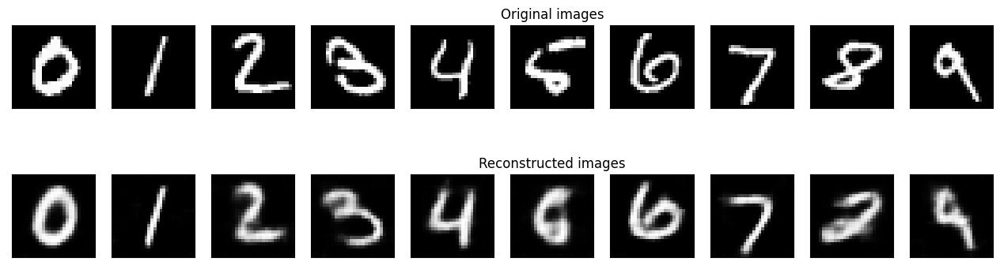

	 partial train loss (single batch): 0.024626
	 partial train loss (single batch): 0.024882
	 partial train loss (single batch): 0.024720
	 partial train loss (single batch): 0.025456
	 partial train loss (single batch): 0.023989
	 partial train loss (single batch): 0.024469
	 partial train loss (single batch): 0.024095
	 partial train loss (single batch): 0.024058
	 partial train loss (single batch): 0.023833
	 partial train loss (single batch): 0.023456
	 partial train loss (single batch): 0.024010
	 partial train loss (single batch): 0.023724
	 partial train loss (single batch): 0.024369
	 partial train loss (single batch): 0.024950
	 partial train loss (single batch): 0.023456
	 partial train loss (single batch): 0.023596
	 partial train loss (single batch): 0.025504
	 partial train loss (single batch): 0.023534
	 partial train loss (single batch): 0.025195
	 partial train loss (single batch): 0.023866
	 partial train loss (single batch): 0.023554
	 partial train loss (single batch

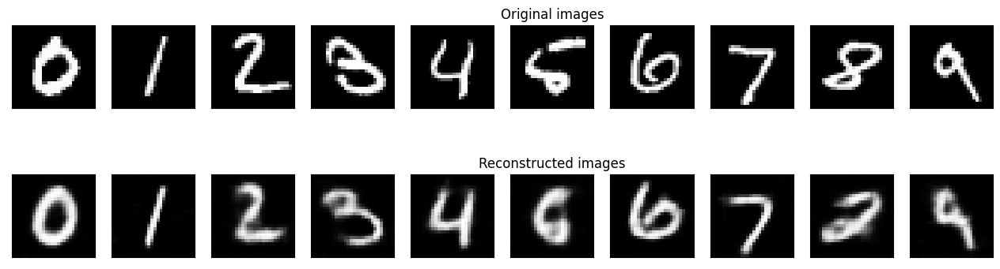

	 partial train loss (single batch): 0.024560
	 partial train loss (single batch): 0.024850
	 partial train loss (single batch): 0.024703
	 partial train loss (single batch): 0.025398
	 partial train loss (single batch): 0.023978
	 partial train loss (single batch): 0.024475
	 partial train loss (single batch): 0.024162
	 partial train loss (single batch): 0.024050
	 partial train loss (single batch): 0.023800
	 partial train loss (single batch): 0.023432
	 partial train loss (single batch): 0.023960
	 partial train loss (single batch): 0.023714
	 partial train loss (single batch): 0.024274
	 partial train loss (single batch): 0.024926
	 partial train loss (single batch): 0.023490
	 partial train loss (single batch): 0.023550
	 partial train loss (single batch): 0.025452
	 partial train loss (single batch): 0.023480
	 partial train loss (single batch): 0.025188
	 partial train loss (single batch): 0.023930
	 partial train loss (single batch): 0.023575
	 partial train loss (single batch

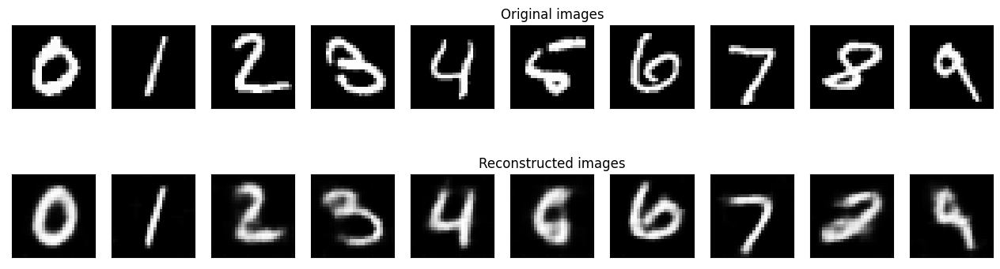

	 partial train loss (single batch): 0.024699
	 partial train loss (single batch): 0.024877
	 partial train loss (single batch): 0.024704
	 partial train loss (single batch): 0.025389
	 partial train loss (single batch): 0.023879
	 partial train loss (single batch): 0.024466
	 partial train loss (single batch): 0.024078
	 partial train loss (single batch): 0.024016
	 partial train loss (single batch): 0.023768
	 partial train loss (single batch): 0.023401
	 partial train loss (single batch): 0.024002
	 partial train loss (single batch): 0.023625
	 partial train loss (single batch): 0.024311
	 partial train loss (single batch): 0.024929
	 partial train loss (single batch): 0.023425
	 partial train loss (single batch): 0.023527
	 partial train loss (single batch): 0.025465
	 partial train loss (single batch): 0.023479
	 partial train loss (single batch): 0.025108
	 partial train loss (single batch): 0.023864
	 partial train loss (single batch): 0.023565
	 partial train loss (single batch

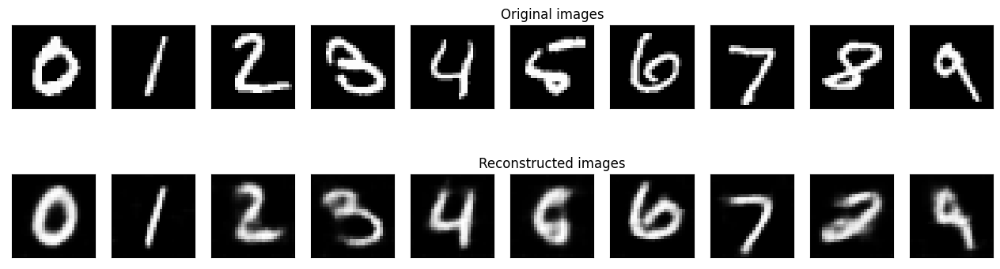

	 partial train loss (single batch): 0.024621
	 partial train loss (single batch): 0.024865
	 partial train loss (single batch): 0.024750
	 partial train loss (single batch): 0.025404
	 partial train loss (single batch): 0.023806
	 partial train loss (single batch): 0.024418
	 partial train loss (single batch): 0.024088
	 partial train loss (single batch): 0.024009
	 partial train loss (single batch): 0.023759
	 partial train loss (single batch): 0.023451
	 partial train loss (single batch): 0.023941
	 partial train loss (single batch): 0.023636
	 partial train loss (single batch): 0.024357
	 partial train loss (single batch): 0.024879
	 partial train loss (single batch): 0.023445
	 partial train loss (single batch): 0.023603
	 partial train loss (single batch): 0.025380
	 partial train loss (single batch): 0.023439
	 partial train loss (single batch): 0.025121
	 partial train loss (single batch): 0.023852
	 partial train loss (single batch): 0.023654
	 partial train loss (single batch

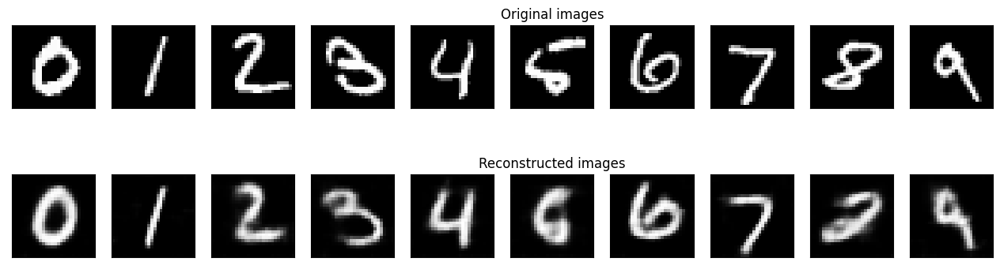

	 partial train loss (single batch): 0.024570
	 partial train loss (single batch): 0.024750
	 partial train loss (single batch): 0.024626
	 partial train loss (single batch): 0.025296
	 partial train loss (single batch): 0.023779
	 partial train loss (single batch): 0.024443
	 partial train loss (single batch): 0.024107
	 partial train loss (single batch): 0.024030
	 partial train loss (single batch): 0.023747
	 partial train loss (single batch): 0.023394
	 partial train loss (single batch): 0.024005
	 partial train loss (single batch): 0.023593
	 partial train loss (single batch): 0.024294
	 partial train loss (single batch): 0.024876
	 partial train loss (single batch): 0.023462
	 partial train loss (single batch): 0.023515
	 partial train loss (single batch): 0.025394
	 partial train loss (single batch): 0.023449
	 partial train loss (single batch): 0.025124
	 partial train loss (single batch): 0.023822
	 partial train loss (single batch): 0.023571
	 partial train loss (single batch

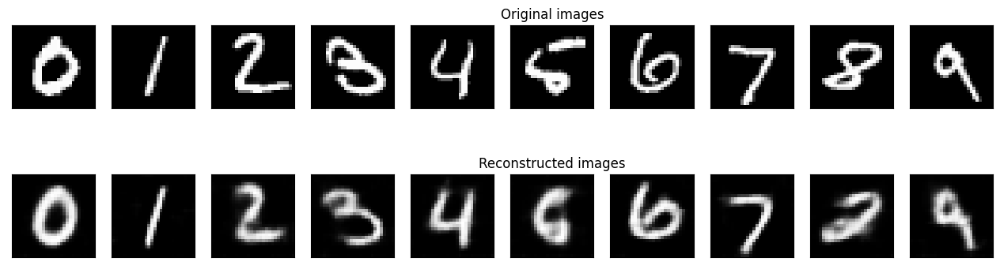

	 partial train loss (single batch): 0.024643
	 partial train loss (single batch): 0.024753
	 partial train loss (single batch): 0.024722
	 partial train loss (single batch): 0.025303
	 partial train loss (single batch): 0.023832
	 partial train loss (single batch): 0.024416
	 partial train loss (single batch): 0.024103
	 partial train loss (single batch): 0.024027
	 partial train loss (single batch): 0.023716
	 partial train loss (single batch): 0.023341
	 partial train loss (single batch): 0.024038
	 partial train loss (single batch): 0.023577
	 partial train loss (single batch): 0.024236
	 partial train loss (single batch): 0.024830
	 partial train loss (single batch): 0.023400
	 partial train loss (single batch): 0.023533
	 partial train loss (single batch): 0.025269
	 partial train loss (single batch): 0.023399
	 partial train loss (single batch): 0.025068
	 partial train loss (single batch): 0.023822
	 partial train loss (single batch): 0.023563
	 partial train loss (single batch

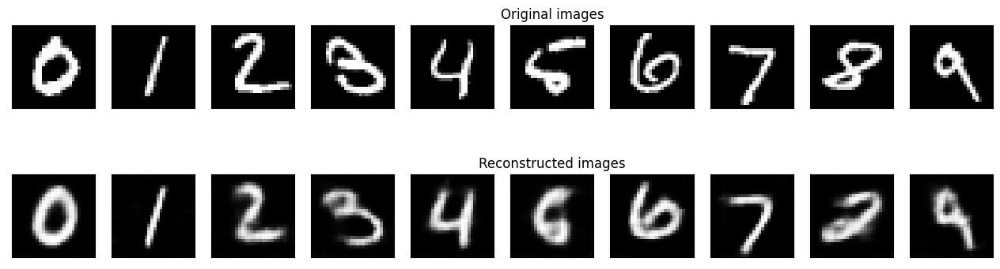

	 partial train loss (single batch): 0.024562
	 partial train loss (single batch): 0.024783
	 partial train loss (single batch): 0.024751
	 partial train loss (single batch): 0.025359
	 partial train loss (single batch): 0.023770
	 partial train loss (single batch): 0.024380
	 partial train loss (single batch): 0.024104
	 partial train loss (single batch): 0.024015
	 partial train loss (single batch): 0.023769
	 partial train loss (single batch): 0.023357
	 partial train loss (single batch): 0.023988
	 partial train loss (single batch): 0.023520
	 partial train loss (single batch): 0.024251
	 partial train loss (single batch): 0.024917
	 partial train loss (single batch): 0.023445
	 partial train loss (single batch): 0.023531
	 partial train loss (single batch): 0.025330
	 partial train loss (single batch): 0.023362
	 partial train loss (single batch): 0.025018
	 partial train loss (single batch): 0.023754
	 partial train loss (single batch): 0.023560
	 partial train loss (single batch

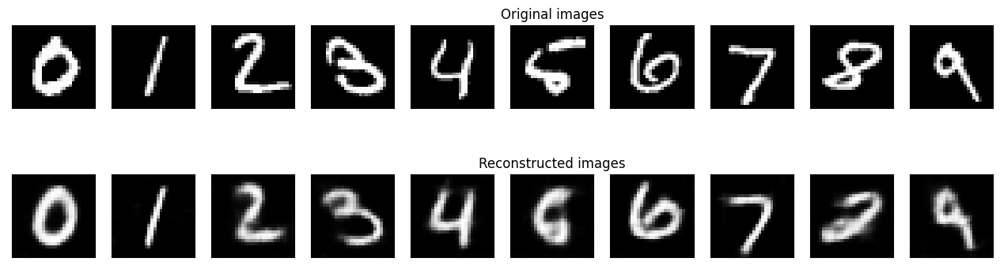

	 partial train loss (single batch): 0.024632
	 partial train loss (single batch): 0.024855
	 partial train loss (single batch): 0.024702
	 partial train loss (single batch): 0.025241
	 partial train loss (single batch): 0.023768
	 partial train loss (single batch): 0.024376
	 partial train loss (single batch): 0.024050
	 partial train loss (single batch): 0.023930
	 partial train loss (single batch): 0.023717
	 partial train loss (single batch): 0.023324
	 partial train loss (single batch): 0.023923
	 partial train loss (single batch): 0.023556
	 partial train loss (single batch): 0.024175
	 partial train loss (single batch): 0.024854
	 partial train loss (single batch): 0.023407
	 partial train loss (single batch): 0.023506
	 partial train loss (single batch): 0.025289
	 partial train loss (single batch): 0.023429
	 partial train loss (single batch): 0.024980
	 partial train loss (single batch): 0.023821
	 partial train loss (single batch): 0.023541
	 partial train loss (single batch

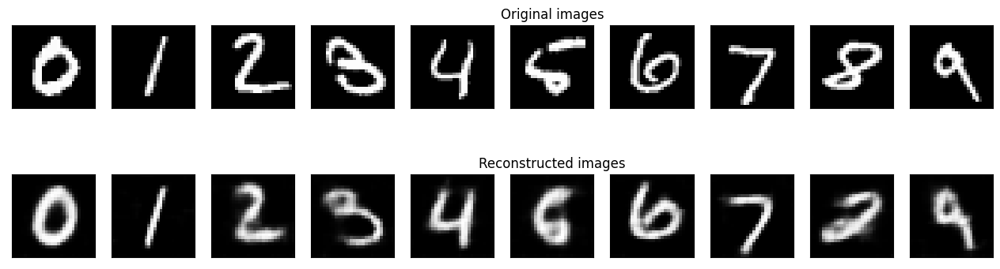

	 partial train loss (single batch): 0.024552
	 partial train loss (single batch): 0.024829
	 partial train loss (single batch): 0.024737
	 partial train loss (single batch): 0.025435
	 partial train loss (single batch): 0.023750
	 partial train loss (single batch): 0.024334
	 partial train loss (single batch): 0.024209
	 partial train loss (single batch): 0.024024
	 partial train loss (single batch): 0.023740
	 partial train loss (single batch): 0.023415
	 partial train loss (single batch): 0.023961
	 partial train loss (single batch): 0.023515
	 partial train loss (single batch): 0.024237
	 partial train loss (single batch): 0.024919
	 partial train loss (single batch): 0.023385
	 partial train loss (single batch): 0.023526
	 partial train loss (single batch): 0.025352
	 partial train loss (single batch): 0.023406
	 partial train loss (single batch): 0.025027
	 partial train loss (single batch): 0.023778
	 partial train loss (single batch): 0.023569
	 partial train loss (single batch

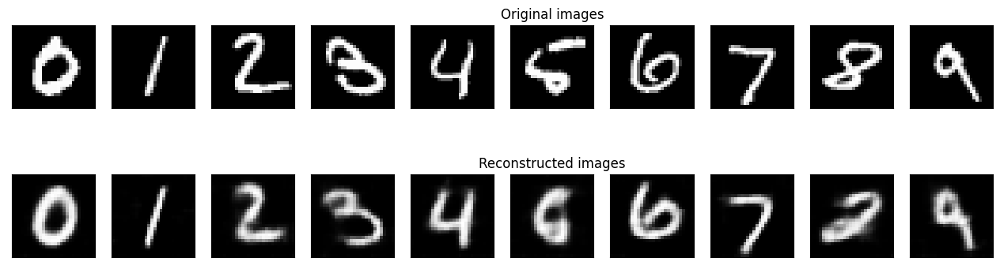

	 partial train loss (single batch): 0.024598
	 partial train loss (single batch): 0.024729
	 partial train loss (single batch): 0.024712
	 partial train loss (single batch): 0.025330
	 partial train loss (single batch): 0.023686
	 partial train loss (single batch): 0.024357
	 partial train loss (single batch): 0.024046
	 partial train loss (single batch): 0.024008
	 partial train loss (single batch): 0.023697
	 partial train loss (single batch): 0.023398
	 partial train loss (single batch): 0.023888
	 partial train loss (single batch): 0.023560
	 partial train loss (single batch): 0.024262
	 partial train loss (single batch): 0.024830
	 partial train loss (single batch): 0.023440
	 partial train loss (single batch): 0.023529
	 partial train loss (single batch): 0.025311
	 partial train loss (single batch): 0.023499
	 partial train loss (single batch): 0.024949
	 partial train loss (single batch): 0.023757
	 partial train loss (single batch): 0.023585
	 partial train loss (single batch

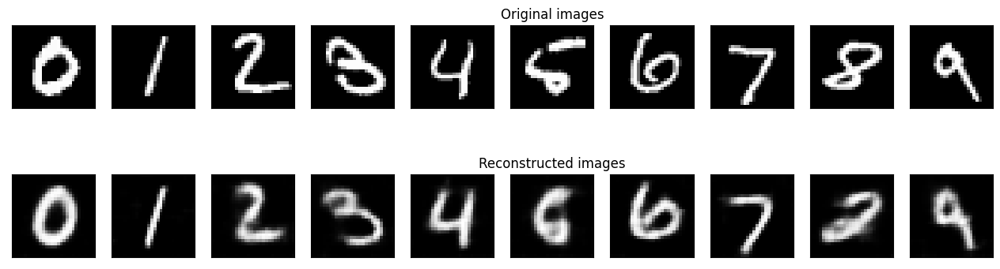

	 partial train loss (single batch): 0.024604
	 partial train loss (single batch): 0.024757
	 partial train loss (single batch): 0.024776
	 partial train loss (single batch): 0.025317
	 partial train loss (single batch): 0.023714
	 partial train loss (single batch): 0.024394
	 partial train loss (single batch): 0.024075
	 partial train loss (single batch): 0.024048
	 partial train loss (single batch): 0.023665
	 partial train loss (single batch): 0.023333
	 partial train loss (single batch): 0.023864
	 partial train loss (single batch): 0.023472
	 partial train loss (single batch): 0.024216
	 partial train loss (single batch): 0.024857
	 partial train loss (single batch): 0.023355
	 partial train loss (single batch): 0.023480
	 partial train loss (single batch): 0.025265
	 partial train loss (single batch): 0.023355
	 partial train loss (single batch): 0.025042
	 partial train loss (single batch): 0.023758
	 partial train loss (single batch): 0.023517
	 partial train loss (single batch

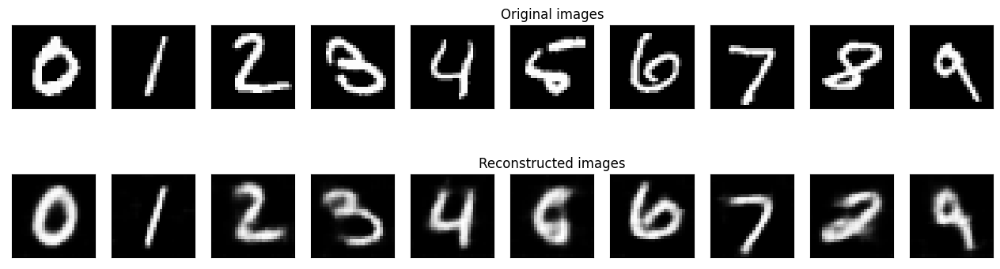

	 partial train loss (single batch): 0.024604
	 partial train loss (single batch): 0.024709
	 partial train loss (single batch): 0.024752
	 partial train loss (single batch): 0.025394
	 partial train loss (single batch): 0.023680
	 partial train loss (single batch): 0.024330
	 partial train loss (single batch): 0.024090
	 partial train loss (single batch): 0.024047
	 partial train loss (single batch): 0.023645
	 partial train loss (single batch): 0.023401
	 partial train loss (single batch): 0.023894
	 partial train loss (single batch): 0.023395
	 partial train loss (single batch): 0.024179
	 partial train loss (single batch): 0.024846
	 partial train loss (single batch): 0.023401
	 partial train loss (single batch): 0.023658
	 partial train loss (single batch): 0.025348
	 partial train loss (single batch): 0.023412
	 partial train loss (single batch): 0.025009
	 partial train loss (single batch): 0.023700
	 partial train loss (single batch): 0.023566
	 partial train loss (single batch

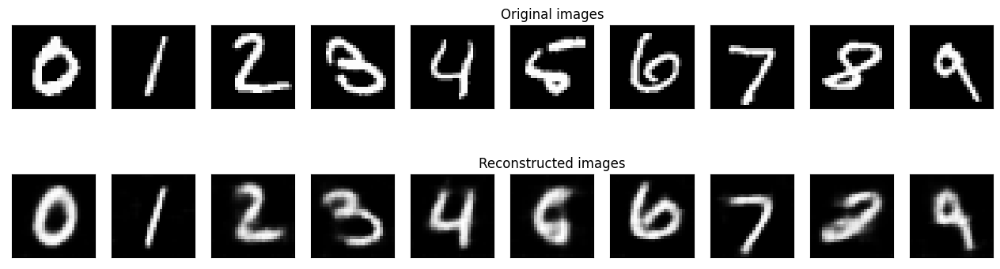

	 partial train loss (single batch): 0.024659
	 partial train loss (single batch): 0.024839
	 partial train loss (single batch): 0.024713
	 partial train loss (single batch): 0.025385
	 partial train loss (single batch): 0.023794
	 partial train loss (single batch): 0.024403
	 partial train loss (single batch): 0.024048
	 partial train loss (single batch): 0.024058
	 partial train loss (single batch): 0.023706
	 partial train loss (single batch): 0.023436
	 partial train loss (single batch): 0.024021
	 partial train loss (single batch): 0.023423
	 partial train loss (single batch): 0.024238
	 partial train loss (single batch): 0.024932
	 partial train loss (single batch): 0.023410
	 partial train loss (single batch): 0.023611
	 partial train loss (single batch): 0.025343
	 partial train loss (single batch): 0.023393
	 partial train loss (single batch): 0.024982
	 partial train loss (single batch): 0.023774
	 partial train loss (single batch): 0.023511
	 partial train loss (single batch

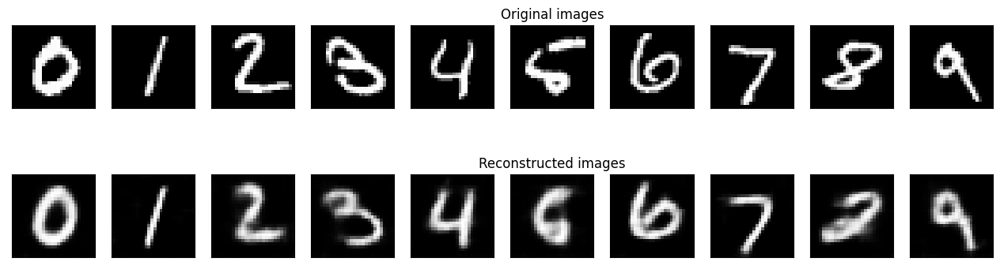

	 partial train loss (single batch): 0.024563
	 partial train loss (single batch): 0.024748
	 partial train loss (single batch): 0.024685
	 partial train loss (single batch): 0.025341
	 partial train loss (single batch): 0.023735
	 partial train loss (single batch): 0.024278
	 partial train loss (single batch): 0.024086
	 partial train loss (single batch): 0.024035
	 partial train loss (single batch): 0.023662
	 partial train loss (single batch): 0.023389
	 partial train loss (single batch): 0.024016
	 partial train loss (single batch): 0.023484
	 partial train loss (single batch): 0.024227
	 partial train loss (single batch): 0.024840
	 partial train loss (single batch): 0.023450
	 partial train loss (single batch): 0.023585
	 partial train loss (single batch): 0.025396
	 partial train loss (single batch): 0.023371
	 partial train loss (single batch): 0.025006
	 partial train loss (single batch): 0.023731
	 partial train loss (single batch): 0.023514
	 partial train loss (single batch

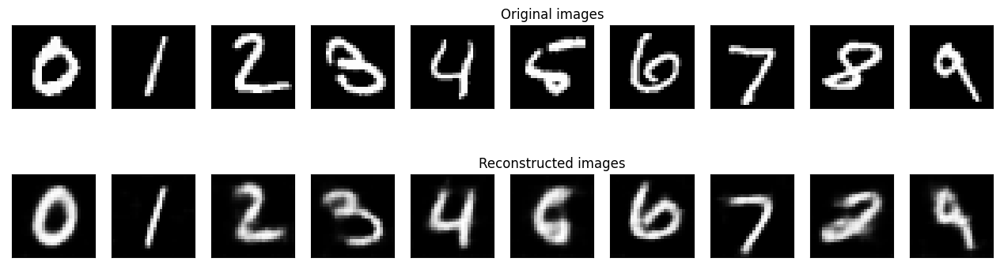

	 partial train loss (single batch): 0.024512
	 partial train loss (single batch): 0.024675
	 partial train loss (single batch): 0.024574
	 partial train loss (single batch): 0.025327
	 partial train loss (single batch): 0.023743
	 partial train loss (single batch): 0.024337
	 partial train loss (single batch): 0.024076
	 partial train loss (single batch): 0.024063
	 partial train loss (single batch): 0.023612
	 partial train loss (single batch): 0.023345
	 partial train loss (single batch): 0.023933
	 partial train loss (single batch): 0.023407
	 partial train loss (single batch): 0.024156
	 partial train loss (single batch): 0.024844
	 partial train loss (single batch): 0.023485
	 partial train loss (single batch): 0.023553
	 partial train loss (single batch): 0.025265
	 partial train loss (single batch): 0.023470
	 partial train loss (single batch): 0.024926
	 partial train loss (single batch): 0.023768
	 partial train loss (single batch): 0.023553
	 partial train loss (single batch

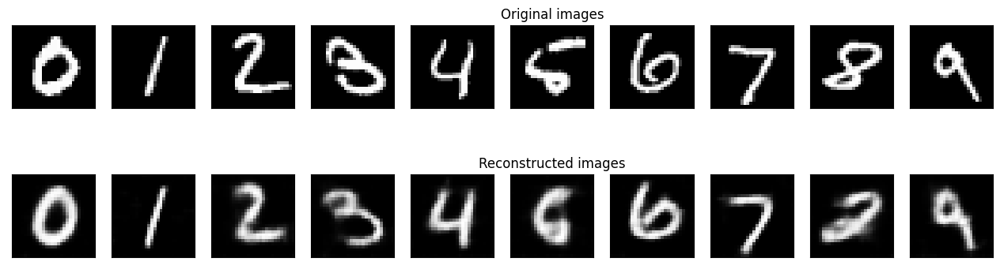

	 partial train loss (single batch): 0.024550
	 partial train loss (single batch): 0.024734
	 partial train loss (single batch): 0.024580
	 partial train loss (single batch): 0.025352
	 partial train loss (single batch): 0.023691
	 partial train loss (single batch): 0.024329
	 partial train loss (single batch): 0.024149
	 partial train loss (single batch): 0.024071
	 partial train loss (single batch): 0.023662
	 partial train loss (single batch): 0.023336
	 partial train loss (single batch): 0.023975
	 partial train loss (single batch): 0.023443
	 partial train loss (single batch): 0.024138
	 partial train loss (single batch): 0.024852
	 partial train loss (single batch): 0.023381
	 partial train loss (single batch): 0.023530
	 partial train loss (single batch): 0.025324
	 partial train loss (single batch): 0.023399
	 partial train loss (single batch): 0.025046
	 partial train loss (single batch): 0.023672
	 partial train loss (single batch): 0.023471
	 partial train loss (single batch

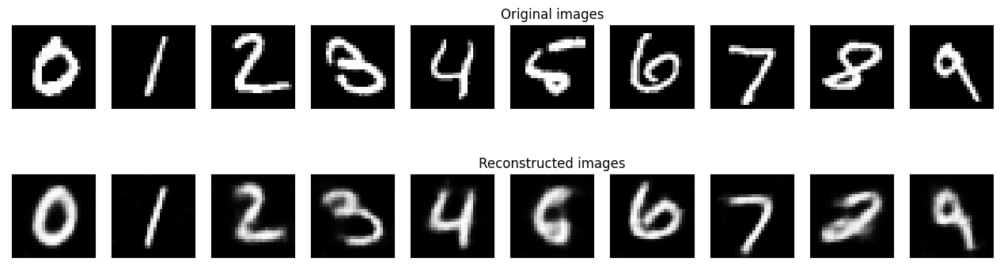

	 partial train loss (single batch): 0.024598
	 partial train loss (single batch): 0.024748
	 partial train loss (single batch): 0.024655
	 partial train loss (single batch): 0.025306
	 partial train loss (single batch): 0.023653
	 partial train loss (single batch): 0.024286
	 partial train loss (single batch): 0.024039
	 partial train loss (single batch): 0.023960
	 partial train loss (single batch): 0.023611
	 partial train loss (single batch): 0.023202
	 partial train loss (single batch): 0.023932
	 partial train loss (single batch): 0.023395
	 partial train loss (single batch): 0.024067
	 partial train loss (single batch): 0.024915
	 partial train loss (single batch): 0.023412
	 partial train loss (single batch): 0.023512
	 partial train loss (single batch): 0.025276
	 partial train loss (single batch): 0.023385
	 partial train loss (single batch): 0.024920
	 partial train loss (single batch): 0.023659
	 partial train loss (single batch): 0.023534
	 partial train loss (single batch

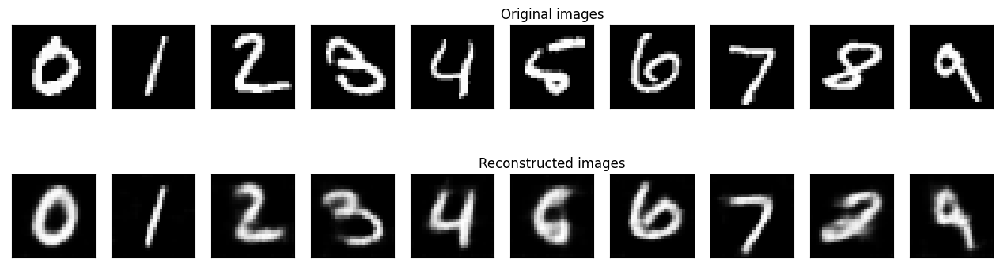

	 partial train loss (single batch): 0.024574
	 partial train loss (single batch): 0.024646
	 partial train loss (single batch): 0.024639
	 partial train loss (single batch): 0.025392
	 partial train loss (single batch): 0.023656
	 partial train loss (single batch): 0.024417
	 partial train loss (single batch): 0.024019
	 partial train loss (single batch): 0.023976
	 partial train loss (single batch): 0.023624
	 partial train loss (single batch): 0.023238
	 partial train loss (single batch): 0.023963
	 partial train loss (single batch): 0.023394
	 partial train loss (single batch): 0.024154
	 partial train loss (single batch): 0.024805
	 partial train loss (single batch): 0.023411
	 partial train loss (single batch): 0.023543
	 partial train loss (single batch): 0.025267
	 partial train loss (single batch): 0.023397
	 partial train loss (single batch): 0.025026
	 partial train loss (single batch): 0.023653
	 partial train loss (single batch): 0.023489
	 partial train loss (single batch

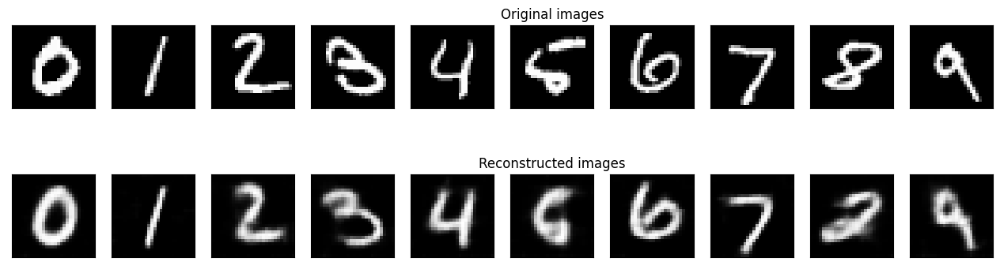

	 partial train loss (single batch): 0.024581
	 partial train loss (single batch): 0.024610
	 partial train loss (single batch): 0.024542
	 partial train loss (single batch): 0.025255
	 partial train loss (single batch): 0.023684
	 partial train loss (single batch): 0.024396
	 partial train loss (single batch): 0.023968
	 partial train loss (single batch): 0.023991
	 partial train loss (single batch): 0.023534
	 partial train loss (single batch): 0.023282
	 partial train loss (single batch): 0.023948
	 partial train loss (single batch): 0.023332
	 partial train loss (single batch): 0.024114
	 partial train loss (single batch): 0.024915
	 partial train loss (single batch): 0.023463
	 partial train loss (single batch): 0.023556
	 partial train loss (single batch): 0.025258
	 partial train loss (single batch): 0.023479
	 partial train loss (single batch): 0.024890
	 partial train loss (single batch): 0.023670
	 partial train loss (single batch): 0.023519
	 partial train loss (single batch

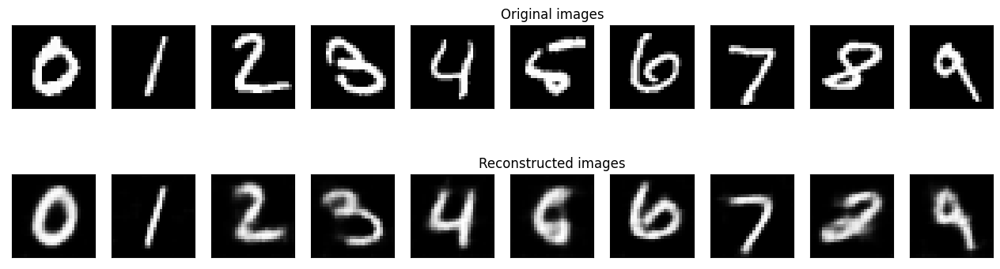

	 partial train loss (single batch): 0.024520
	 partial train loss (single batch): 0.024651
	 partial train loss (single batch): 0.024490
	 partial train loss (single batch): 0.025246
	 partial train loss (single batch): 0.023626
	 partial train loss (single batch): 0.024393
	 partial train loss (single batch): 0.023941
	 partial train loss (single batch): 0.024033
	 partial train loss (single batch): 0.023621
	 partial train loss (single batch): 0.023330
	 partial train loss (single batch): 0.024030
	 partial train loss (single batch): 0.023365
	 partial train loss (single batch): 0.024116
	 partial train loss (single batch): 0.024828
	 partial train loss (single batch): 0.023400
	 partial train loss (single batch): 0.023588
	 partial train loss (single batch): 0.025283
	 partial train loss (single batch): 0.023514
	 partial train loss (single batch): 0.025000
	 partial train loss (single batch): 0.023607
	 partial train loss (single batch): 0.023572
	 partial train loss (single batch

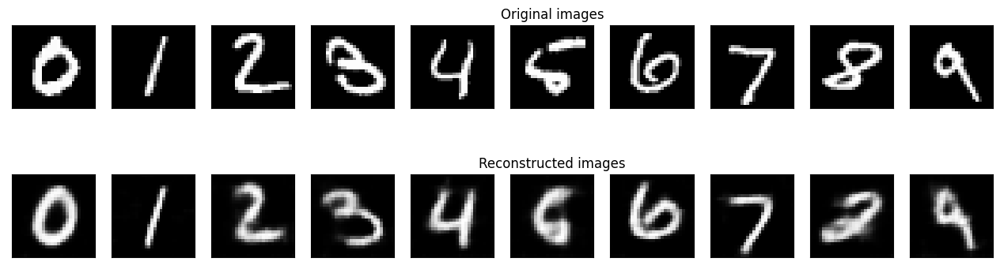

In [7]:

num_epochs = 100
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss =train_epoch(encoder,decoder,device,
   train_loader,loss_fn,optim)
   val_loss = test_epoch(encoder,decoder,device,test_loader,loss_fn)
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   plot_ae_outputs(encoder,decoder,n=10)

In [8]:
test_epoch(encoder,decoder,device,test_loader,loss_fn).item()

0.025245800614356995

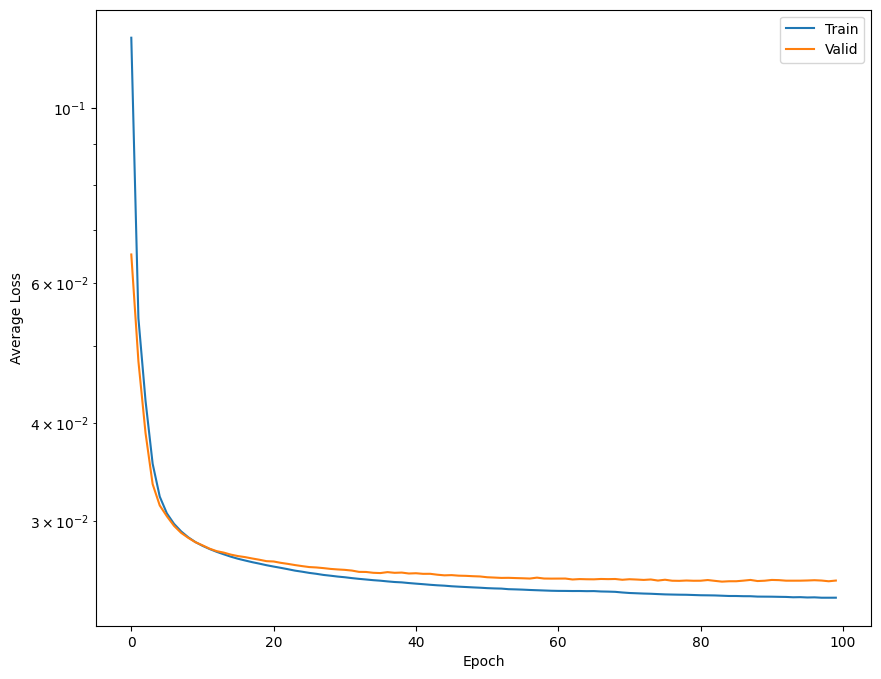

In [9]:

# Plot losses
plt.figure(figsize=(10,8))
plt.semilogy(diz_loss['train_loss'], label='Train')
plt.semilogy(diz_loss['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
#plt.grid()
plt.legend()
#plt.title('loss')
plt.show()

tensor([-0.1325,  0.0906,  0.1901, -0.0349])
tensor([0.4997, 0.4654, 0.5788, 0.5192])


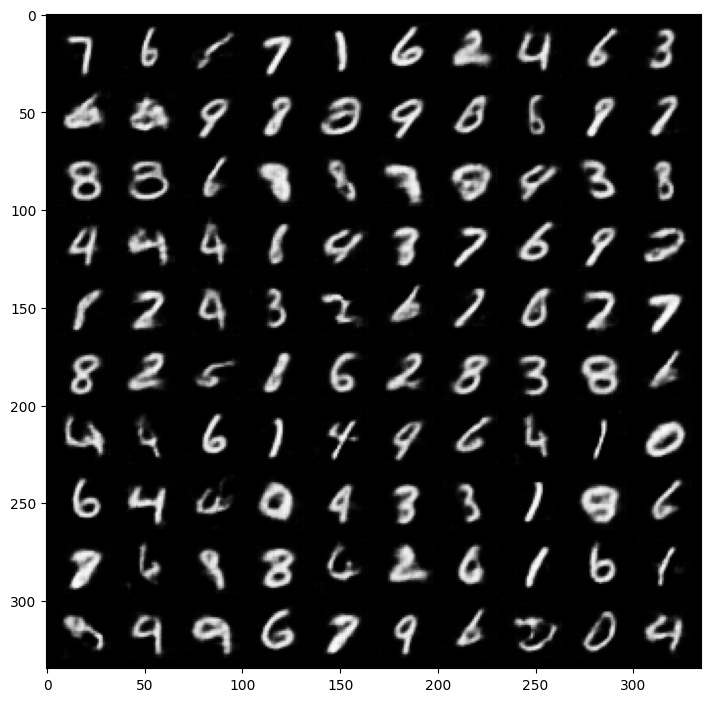

In [10]:
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

encoder.eval()
decoder.eval()

with torch.no_grad():
    # calculate mean and std of latent code, generated takining in test images as inputs 
    images, labels = next(iter(test_loader))
    images = images.to(device)
    latent = encoder(images)
    latent = latent.cpu()

    mean = latent.mean(dim=0)
    print(mean)
    std = (latent - mean).pow(2).mean(dim=0).sqrt()
    print(std)

    # sample latent vectors from the normal distribution
    latent = torch.randn(128, d)*std + mean

    # reconstruct images from the random latent vectors
    latent = latent.to(device)
    img_recon = decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(20, 8.5))
    show_image(torchvision.utils.make_grid(img_recon[:100],10,5))
    plt.show()

In [11]:
from tqdm import tqdm
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

100%|██████████| 10000/10000 [00:06<00:00, 1653.17it/s]


,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,label
0,-1.016187,0.737190,1.035585,-1.423545,7
1,0.168677,0.369217,0.768128,0.244115,2
2,-1.103515,0.952253,0.461931,0.351309,1
3,0.332419,-0.607713,-0.344826,0.012993,0
4,-0.595111,0.051034,-0.794648,-0.218461,4
...,...,...,...,...,...
9995,0.234011,0.069018,1.455484,0.097496,2
9996,0.518177,0.137667,0.615430,0.078273,3
9997,-1.181454,0.189219,-0.342147,-0.121942,4
9998,-0.320935,-0.586121,0.275680,0.127393,5


In [22]:
encoded_train = []
for sample in tqdm(train_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_train.append(encoded_sample)
encoded_train = pd.DataFrame(encoded_train)
encoded_train

100%|██████████| 60000/60000 [00:34<00:00, 1730.75it/s]


,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,label
0,0.077750,-0.117585,0.227488,0.024443,5
1,0.450838,-0.847086,-0.177324,0.071972,0
2,-1.452390,0.558744,-1.618393,-1.004389,4
3,-1.039147,0.287287,0.493509,0.362378,1
4,-0.397145,0.161491,-0.095498,-0.296224,9
...,...,...,...,...,...
59995,-0.129464,-0.123850,0.373183,-0.172630,8
59996,0.175015,-0.119067,0.652740,-0.024753,3
59997,0.033884,-0.059005,0.179776,-0.075228,5
59998,-0.128841,0.040347,-0.440719,1.010593,6


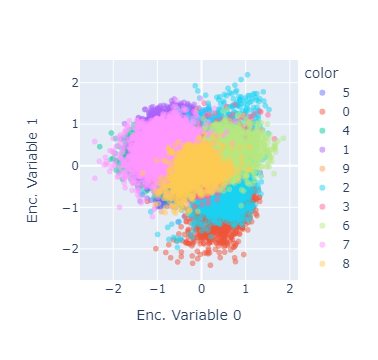

In [161]:
import plotly.express as px

px.scatter(encoded_train, x='Enc. Variable 0', y='Enc. Variable 1', 
           color=encoded_train.label.astype(str), opacity=0.5)


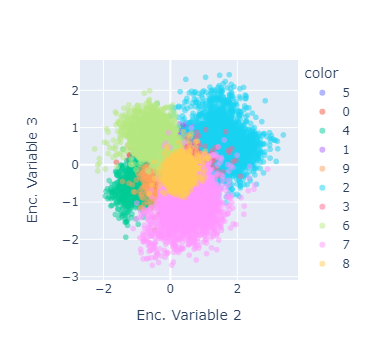

In [163]:
px.scatter(encoded_train, x='Enc. Variable 2', y='Enc. Variable 3', 
           color=encoded_train.label.astype(str), opacity=0.5)

In [127]:
encoded_train.drop(['label'],axis=1)

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3
0,0.077750,-0.117585,0.227488,0.024443
1,0.450838,-0.847086,-0.177324,0.071972
2,-1.452390,0.558744,-1.618393,-1.004389
3,-1.039147,0.287287,0.493509,0.362378
4,-0.397145,0.161491,-0.095498,-0.296224
...,...,...,...,...
59995,-0.129464,-0.123850,0.373183,-0.172630
59996,0.175015,-0.119067,0.652740,-0.024753
59997,0.033884,-0.059005,0.179776,-0.075228
59998,-0.128841,0.040347,-0.440719,1.010593


In [134]:
from umap import UMAP

# Initialize UMAP model with 2 components
umap = UMAP(n_components=2)

# Fit the model and transform the data
umap_results = umap.fit_transform(encoded_train.drop(['label'],axis=1))

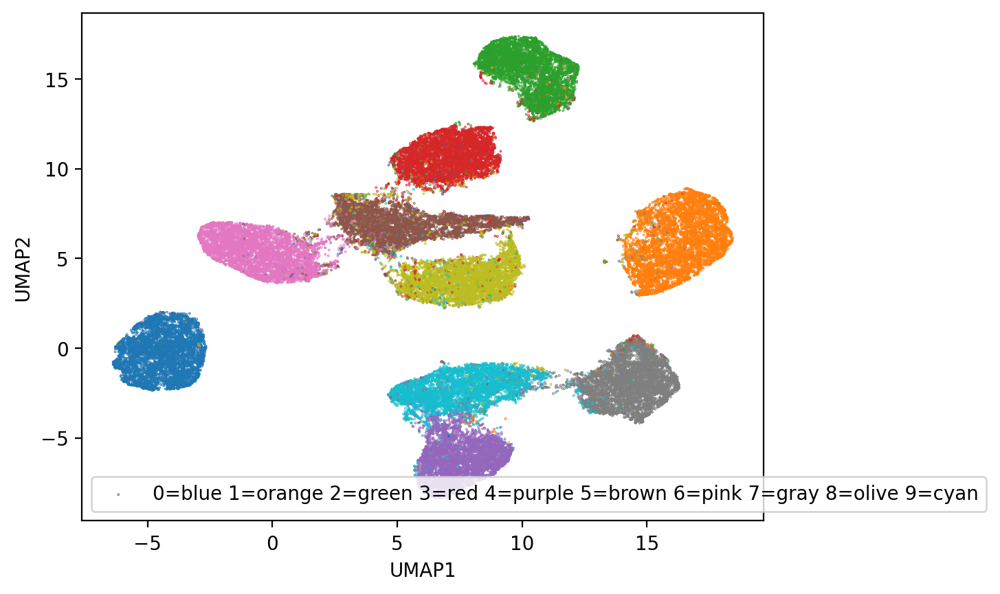

In [153]:
color = ['tab:blue', 'tab:orange', 'tab:green',
         'tab:red', 'tab:purple', 'tab:brown',
            'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan']
color_map = []
test = [color_map.append(color[int(i[0])]) for i in encoded_train.label.astype(str)]
sizes = [0.1 for i in umap_results[:,0:1]]
plt.figure(dpi=200)
plt.scatter([i[0] for i in umap_results[:,0:1]], [i[0] for i in umap_results[:,1:]], sizes ,color=color_map)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(["0=blue 1=orange 2=green 3=red 4=purple 5=brown 6=pink 7=gray 8=olive 9=cyan"])
plt.show()

In [168]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
X_AE = encoded_train.drop(['label'],axis=1)

# kmeans with k=10
kmeans = KMeans(n_clusters=10, random_state=0).fit(X_AE)
kmeans.labels_.astype(str)

encoded_train["kmean_label"] = kmeans.labels_.astype(str)
encoded_train

/home/muellert/.local/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,label,kmean_label
0,0.077750,-0.117585,0.227488,0.024443,5,3
1,0.450838,-0.847086,-0.177324,0.071972,0,7
2,-1.452390,0.558744,-1.618393,-1.004389,4,0
3,-1.039147,0.287287,0.493509,0.362378,1,1
4,-0.397145,0.161491,-0.095498,-0.296224,9,4
...,...,...,...,...,...,...
59995,-0.129464,-0.123850,0.373183,-0.172630,8,8
59996,0.175015,-0.119067,0.652740,-0.024753,3,3
59997,0.033884,-0.059005,0.179776,-0.075228,5,3
59998,-0.128841,0.040347,-0.440719,1.010593,6,6


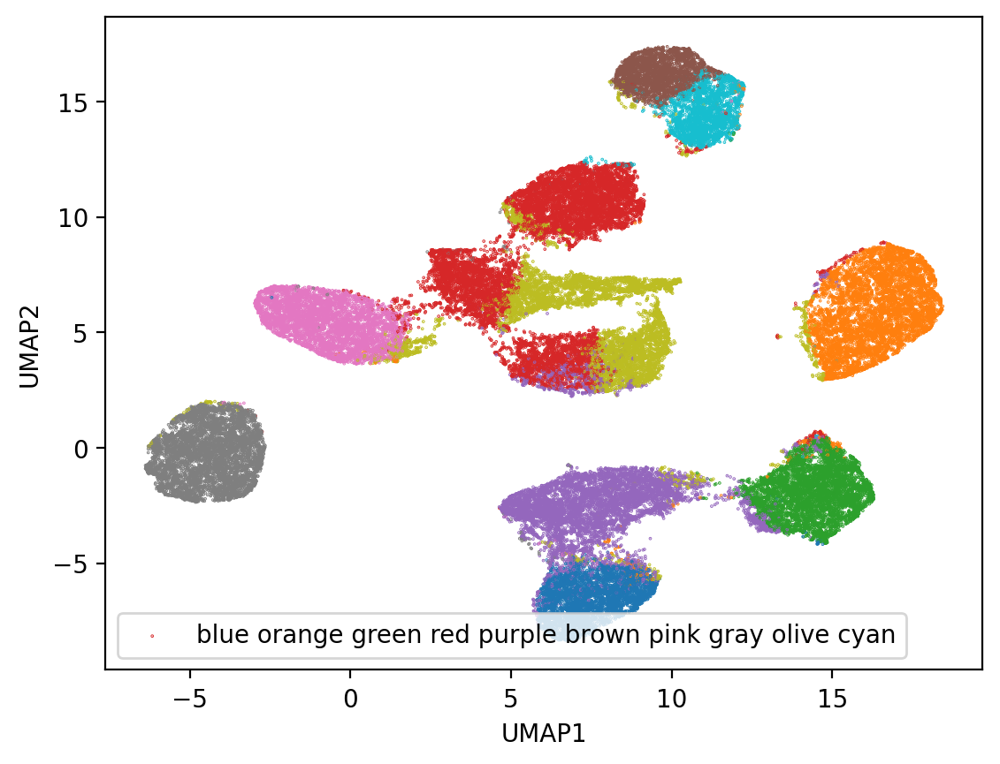

In [170]:
color = ['tab:blue', 'tab:orange', 'tab:green',
         'tab:red', 'tab:purple', 'tab:brown',
            'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan']
color_map = []
test = [color_map.append(color[int(i[0])]) for i in encoded_train.kmean_label.astype(str)]
sizes = [0.1 for i in umap_results[:,0:1]]
plt.figure(dpi=200)
plt.scatter([i[0] for i in umap_results[:,0:1]], [i[0] for i in umap_results[:,1:]], sizes ,color=color_map)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(["blue orange green red purple brown pink gray olive cyan"])
plt.show()

In [147]:
encoded_raw = []
for sample in tqdm(train_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    #print(img.shape)
     #Encode image
    
    # Append to list
    encoded_img = img.flatten().cpu().numpy()
    #print(encoded_img)
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    #print(encoded_sample)
    encoded_raw.append(encoded_sample)
encoded_raw = pd.DataFrame(encoded_raw)
encoded_raw

100%|██████████| 60000/60000 [00:23<00:00, 2536.35it/s]


,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,Enc. Variable 4,Enc. Variable 5,Enc. Variable 6,Enc. Variable 7,Enc. Variable 8,Enc. Variable 9,...,Enc. Variable 775,Enc. Variable 776,Enc. Variable 777,Enc. Variable 778,Enc. Variable 779,Enc. Variable 780,Enc. Variable 781,Enc. Variable 782,Enc. Variable 783,label
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8
59996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
59997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
59998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6


In [148]:
# Initialize UMAP model with 2 components
umap_raw = UMAP(n_components=2)

# Fit the model and transform the data
umap_results_raw = umap.fit_transform(encoded_raw.drop(['label'],axis=1))

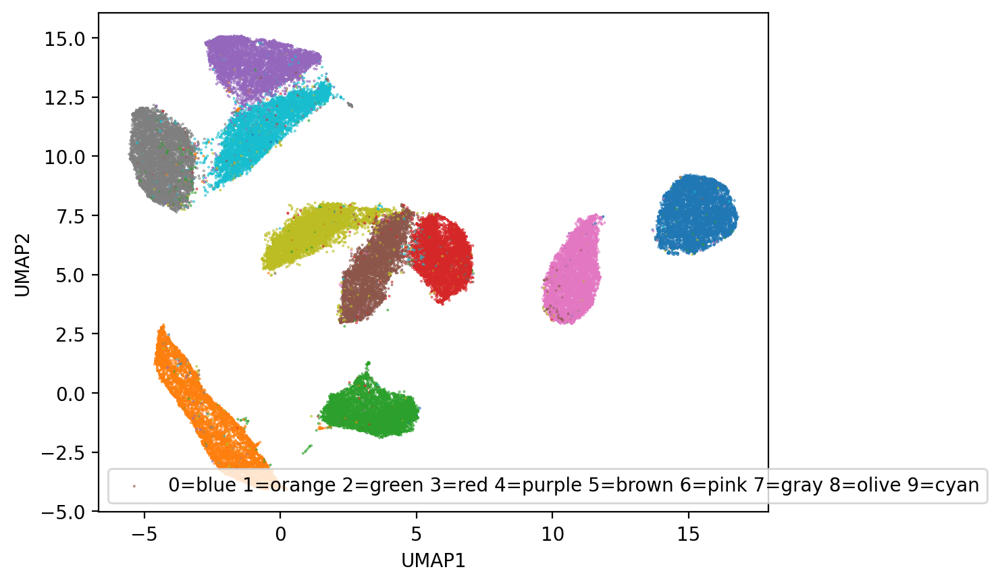

In [152]:
color = ['tab:blue', 'tab:orange', 'tab:green',
         'tab:red', 'tab:purple', 'tab:brown',
            'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan']
color_map = []
test = [color_map.append(color[int(i[0])]) for i in encoded_raw.label.astype(str)]
sizes = [0.1 for i in umap_results_raw[:,0:1]]
plt.figure(dpi=200)
plt.scatter([i[0] for i in umap_results_raw[:,0:1]], [i[0] for i in umap_results_raw[:,1:]], sizes ,color=color_map)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(["0=blue 1=orange 2=green 3=red 4=purple 5=brown 6=pink 7=gray 8=olive 9=cyan"])
plt.show()

In [172]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
X_raw = encoded_raw.drop(['label'],axis=1)

# kmeans with k=10
kmeans = KMeans(n_clusters=10, random_state=0).fit(X_raw)
kmeans.labels_.astype(str)

encoded_raw["kmean_label"] = kmeans.labels_.astype(str)
encoded_raw

/home/muellert/.local/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,Enc. Variable 4,Enc. Variable 5,Enc. Variable 6,Enc. Variable 7,Enc. Variable 8,Enc. Variable 9,...,Enc. Variable 776,Enc. Variable 777,Enc. Variable 778,Enc. Variable 779,Enc. Variable 780,Enc. Variable 781,Enc. Variable 782,Enc. Variable 783,label,kmean_label
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,5
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,5
59996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,5
59997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,5
59998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6,9


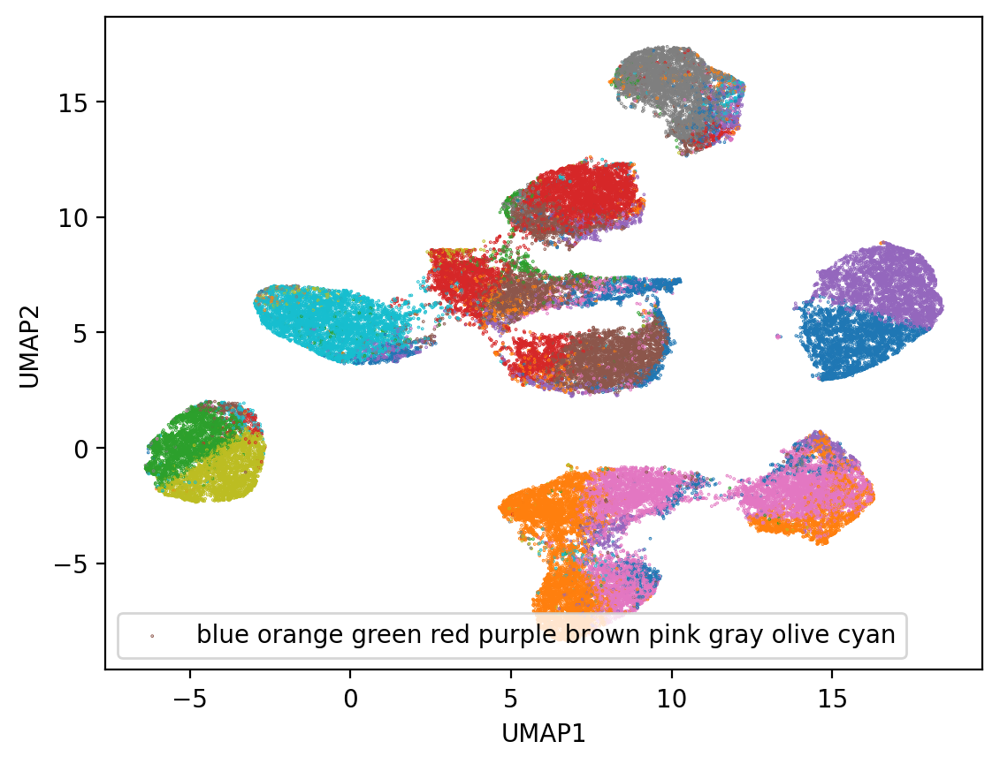

In [173]:
color = ['tab:blue', 'tab:orange', 'tab:green',
         'tab:red', 'tab:purple', 'tab:brown',
            'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan']
color_map = []
test = [color_map.append(color[int(i[0])]) for i in encoded_raw.kmean_label.astype(str)]
sizes = [0.1 for i in umap_results[:,0:1]]
plt.figure(dpi=200)
plt.scatter([i[0] for i in umap_results[:,0:1]], [i[0] for i in umap_results[:,1:]], sizes ,color=color_map)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(["blue orange green red purple brown pink gray olive cyan"])
plt.show()